In [238]:
import numpy as np
import random
import matplotlib.pyplot as plt
import scipy.io
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.graph_objects as go 
import sys
# Adjust the path below to the path of your `module_directory`
sys.path.append('../thesis-2p-behavior-align/')
# Now you can import your module or function
import imaging_behavior_functions
import odor_behavioral_analysis
import scipy.cluster.hierarchy as sch
import glob
from scipy.stats import zscore
from scipy.stats import sem
import mat73
from rastermap import Rastermap, utils
from matplotlib import patches
import matplotlib.cm as cm
from scipy.ndimage import gaussian_filter1d
import tifffile


In [4]:
base_path = "//research.files.med.harvard.edu/neurobio/wilsonlab/Jingxuan/stacks/"
example_path_data = base_path+"20240314-4_MB042B_TOM20GCAMP7f_odor/data/"
example_path_results = base_path+"20240314-4_MB042B_TOM20GCAMP7f_odor/results/"
trial_num = 3
odor_threshold = 5
time_interval_threshold = 16  # Assuming time is in seconds or an equivalent unit
k = 8
window_size = 30

is_mat73, roi_df, dff_raw, kinematics_raw, preprocessed_vars_ds, preprocessed_vars_odor = imaging_behavior_functions.load_intermediate_mat(example_path_data,trial_num)
behav_df = imaging_behavior_functions.make_df_behavior(dff_raw, preprocessed_vars_ds, preprocessed_vars_odor,trial_num,ball_d = 9)
xPos, yPos = imaging_behavior_functions.reconstruct_path(behav_df, ball_d = 9)
roi_names, hdeltab_index, epg_index, hdeltab_sequence, epg_sequence = imaging_behavior_functions.get_roi_seq(roi_df)
dff_all_rois, dff_time = imaging_behavior_functions.load_dff_raw(is_mat73, dff_raw)
neural_df = imaging_behavior_functions.make_df_neural(dff_all_rois, dff_time, roi_names, hdeltab_index, epg_index, hdeltab_sequence, epg_sequence)
behav_df, padded_result_df, smoothed_df = odor_behavioral_analysis.analysis_dfs(behav_df, time_interval_threshold, k, window_size)
combined_df = imaging_behavior_functions.combine_df(behav_df, neural_df)
smoothed_df["translationalV_smoothed"] = np.sqrt(smoothed_df["fwV_smoothed"]**2+smoothed_df["sideV_smoothed"]**2)

In [21]:
selected_df = neural_df.drop(columns=['time'])
if 'odor' in behav_df.columns:
    odor_mask = behav_df['odor'] > 5

In [7]:
base_dir = '//research.files.med.harvard.edu/neurobio/wilsonlab/Jingxuan/stacks/20240314-4_MB042B_TOM20GCAMP7f_odor/E_05_Iter_10080_t3/suite2p/plane0'
F = np.load(base_dir+'/F.npy', allow_pickle=True)
Fneu = np.load(base_dir+'/Fneu.npy', allow_pickle=True)
spks = np.load(base_dir+'/spks.npy', allow_pickle=True)
stat = np.load(base_dir+'/stat.npy', allow_pickle=True)
ops =  np.load(base_dir+'/ops.npy', allow_pickle=True)
ops = ops.item()
iscell = np.load(base_dir+'/iscell.npy', allow_pickle=True)

In [8]:
F_cell = F[(iscell[:,0]==1),:]
spks_cell = spks[(iscell[:,0]==1),:]
Fneu_cell = Fneu[(iscell[:,0]==1),:]
stat_cell = stat[(iscell[:,0]==1)]

In [9]:
def dfoverf(F):
    # Determine F_0 using the 5th percentile of the fluorescence data
    F_0 = np.percentile(F, 5, axis=1)

    # Calculate ΔF/F
    deltaF_over_F = (F - F_0[:, np.newaxis]) / F_0[:, np.newaxis]
    return deltaF_over_F
dF_cell = dfoverf(F_cell)

## Rastermap

In [10]:
# load appropriate activity 
activity_mode = 0
if activity_mode == 0:
    fl_cell = F_cell
elif activity_mode == 1:
    fl_cell = Fneu_cell
elif activity_mode == 2:
    fl_cell = F_cell - 0.7 * Fneu_cell
else:
    fl_cell = dF_cell

In [11]:
fl_cell = zscore(fl_cell, axis=1)
fl_cell_norm = np.maximum(-4, np.minimum(8, fl_cell)) + 4
fl_cell_norm /= 12

In [16]:
x_pos = np.array([stat[i]['med'][0] for i in range(len(stat))])
x_pos_cell = x_pos[(iscell[:,0]==1)]
y_pos = np.array([stat[i]['med'][1] for i in range(len(stat))])
y_pos_cell = y_pos[(iscell[:,0]==1)]

In [12]:
model = Rastermap(n_clusters=12, # number of clusters to compute
                  n_PCs=160, # number of PCs to use
                  locality=0.75, # locality in sorting to find sequences (this is a value from 0-1)
                  time_lag_window=5, # use future timepoints to compute correlation
                  grid_upsample=10, # default value, 10 is good for large recordings
                  ).fit(fl_cell_norm)
y = model.embedding # neurons x 1
isort = model.isort

normalizing data across axis=1
projecting out mean along axis=0
data normalized, 0.42sec
sorting activity: 1070 valid samples by 35531 timepoints
n_PCs = 160 computed, 4.65sec
10 clusters computed, time 4.79sec
clusters sorted, time 4.81sec
clusters upsampled, time 4.83sec
rastermap complete, time 4.86sec


In [13]:
model.__dict__

{'n_clusters': 10,
 'n_PCs': 160,
 'time_lag_window': 5,
 'locality': 0.75,
 'grid_upsample': 10,
 'time_bin': 0,
 'normalize': True,
 'mean_time': True,
 'n_splits': 0,
 'run_scaled_kmeans': True,
 'verbose': True,
 'verbose_sorting': False,
 'keep_norm_X': True,
 'bin_size': 0,
 'symmetric': False,
 'sticky': True,
 'nc_splits': None,
 'smoothness': 1,
 'sorting_algorithm': 'travelling_salesman',
 'X': array([[-1.9452617 , -1.9754186 , -1.7489476 , ...,  1.242815  ,
          1.2308297 ,  0.9511875 ],
        [-2.900701  , -2.9227824 , -2.9488897 , ...,  0.5802884 ,
          0.6072538 ,  0.36168864],
        [ 0.44759762,  0.5203516 ,  0.67488563, ..., -1.1140034 ,
         -1.1253893 , -1.2589715 ],
        ...,
        [ 2.8262165 ,  3.0157015 ,  2.9343197 , ..., -1.4532219 ,
         -0.76986074, -0.43421832],
        [-1.2421486 , -1.5675697 , -1.6739995 , ...,  0.47531098,
          1.1271937 ,  1.1453775 ],
        [ 0.6462931 ,  0.9407058 ,  0.3785934 , ...,  0.34491944,
    

In [14]:
n_neurons, n_time = fl_cell.shape
nbin = 1 # number of neurons to bin over
ndiv = (n_neurons//nbin) * nbin
# group sorted matrix into rows of length nbin
sn = fl_cell[isort][:ndiv].reshape(ndiv//nbin, nbin, -1)
# take mean over neurons in a bin
sn = sn.mean(axis=1)

(-0.5, 0.5, 1069.5, -0.5)

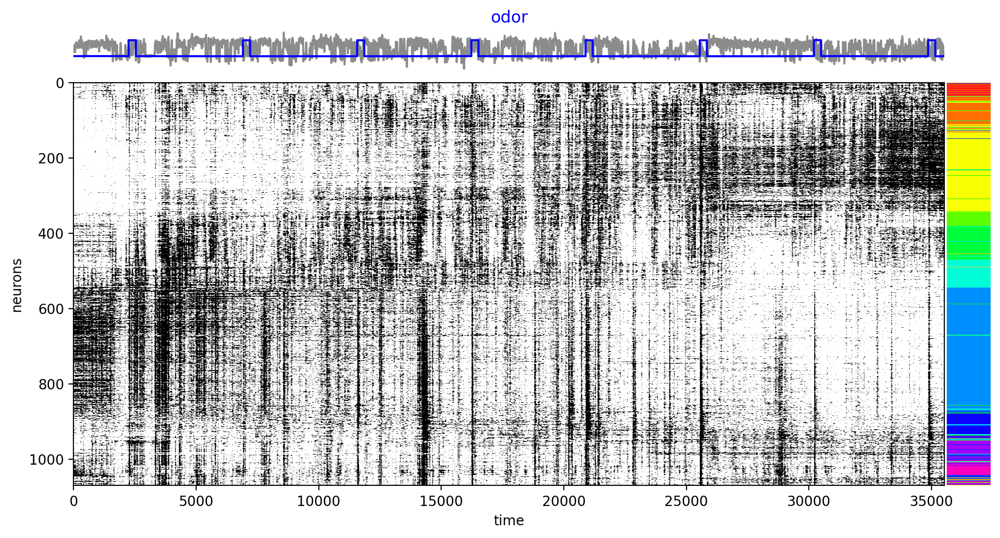

In [237]:
# timepoints to visualize
xmin = 0
xmax = xmin + len(behav_df)

# make figure with grid for easy plotting
fig = plt.figure(figsize=(12,6), dpi=200)
grid = plt.GridSpec(9, 20, figure=fig, wspace = 0.05, hspace = 0.3)

# colors for the behaviors
kp_colors = np.array([[0.55,0.55,0.55], [0.,0.,1],
                      [0.8,0,0], [1.,0.4,0.2],
                      [0,0.6,0.4], [0.2,1,0.5],
                      ])

# plot running speed
ax = plt.subplot(grid[0, :-1])
ax.plot(smoothed_df.fwV_smoothed[xmin:xmax], color=kp_colors[0])
ax.set_xlim([0, xmax-xmin])
ax.axis("off")
ax.set_title("forward speed", color=kp_colors[0])

# plot behavior
ax = plt.subplot(grid[0, :-1])
ax.plot(np.array(behav_df.odor[xmin:xmax]), color=kp_colors[1])
ax.set_xlim([0, xmax-xmin])
ax.axis("off")
ax.set_title("odor", color=kp_colors[1])


# plot superneuron activity
ax = plt.subplot(grid[1:, :-1])
ax.imshow(sn[:, xmin:xmax], cmap="gray_r", vmin=0, vmax=0.8, aspect="auto")
ax.set_xlabel("time")
ax.set_ylabel("neurons")

ax = plt.subplot(grid[1:, -1])
ax.imshow(model.embedding_clust[isort][:,np.newaxis], cmap="gist_rainbow", aspect="auto")
ax.axis("off")



In [ ]:
# Path to your TIFF file
file_path = base_dir + '../../../20240314_4_3_0_35531_256_256_uint16__E_05_Iter_10080_output.tif'

# Initialize an array to hold the sum of all images
sum_image = np.zeros((256, 256), dtype=np.float64)

# Initialize a variable to count the number of images (time points)
count = 0

# Read and process the TIFF file slice by slice
with tifffile.TiffFile(file_path) as tif:
    for page in tif.pages:
        # Assuming each page is a 2D image (256x256) at a different time point
        img = page.asarray()
        sum_image += img
        count += 1

        # Optionally, print progress
        if count % 1000 == 0:
            print(f"Processed {count}/{len(tif.pages)} images.")

# Calculate the mean image
mean_image = sum_image / count




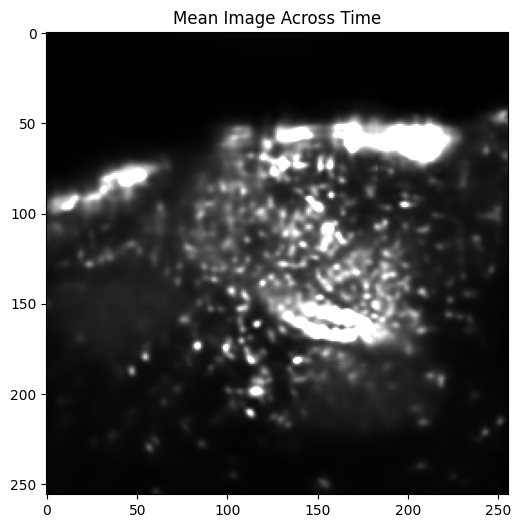

In [251]:
# Display the mean image
plt.figure(figsize=(6,6))
plt.imshow(mean_image, cmap='gray', vmin=np.percentile(mean_image, 5), vmax=np.percentile(mean_image, 97))
#plt.scatter(y_pos_cell, x_pos_cell, s = 8, c=model.embedding_clust, cmap="gist_rainbow",alpha=0.5)
plt.title('Mean Image Across Time')
#plt.colorbar()
plt.show()


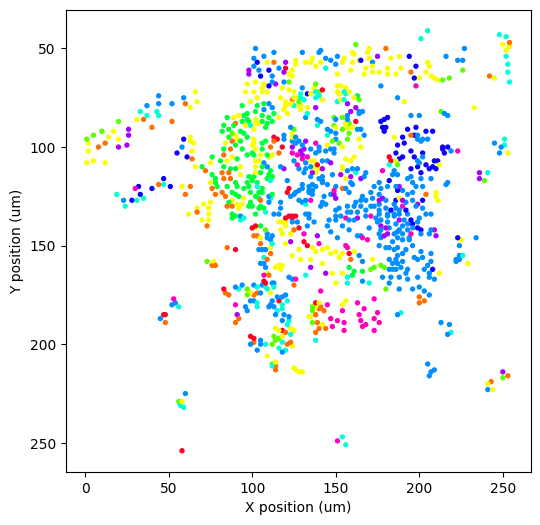

In [17]:
# POSITIONS OF ALL NEURONS
plt.figure(figsize=(6,6))
plt.scatter(y_pos_cell, x_pos_cell, s = 8, c=model.embedding_clust, cmap="gist_rainbow")
plt.xlabel('X position (um)')
plt.ylabel('Y position (um)')
plt.gca().invert_yaxis()
#plt.axis("square")

In [18]:
unique_val, unqiue_counts = np.unique(model.embedding_clust,return_counts=True)
print(unqiue_counts)

[ 34  78 234  46  90  79 351  63  49  46]


In [19]:
unique_val

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=int64)

C:\Users\wilson\AppData\Local\Temp\ipykernel_24280\3714900486.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('gist_rainbow')


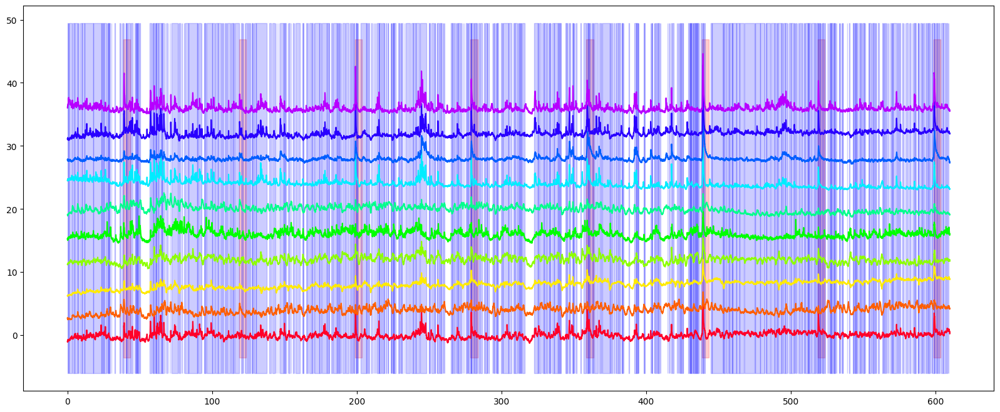

In [100]:
x_bins = unique_val[unqiue_counts>30]
# Get the gist_rainbow colormap
cmap = cm.get_cmap('gist_rainbow')
clus_mean = []
fig, ax = plt.subplots(figsize=(20,8))
y_offset = 4
for clus_index in x_bins:
    clus_ts = fl_cell[model.embedding_clust == clus_index]
    color = cmap(clus_index / len(unique_val))
    ax.plot(behav_df.time,np.mean(clus_ts,axis=0)+ (clus_index * y_offset),color=color)
    clus_mean.append(np.mean(clus_ts,axis=0))
ax.fill_between(behav_df.time, ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.2)
motion_mask = (behav_df.fwV >= 4)
#heading_mask = 
ax.fill_between(behav_df.time, ax.get_ylim()[0], ax.get_ylim()[1], where=motion_mask, color='blue', alpha=0.2)


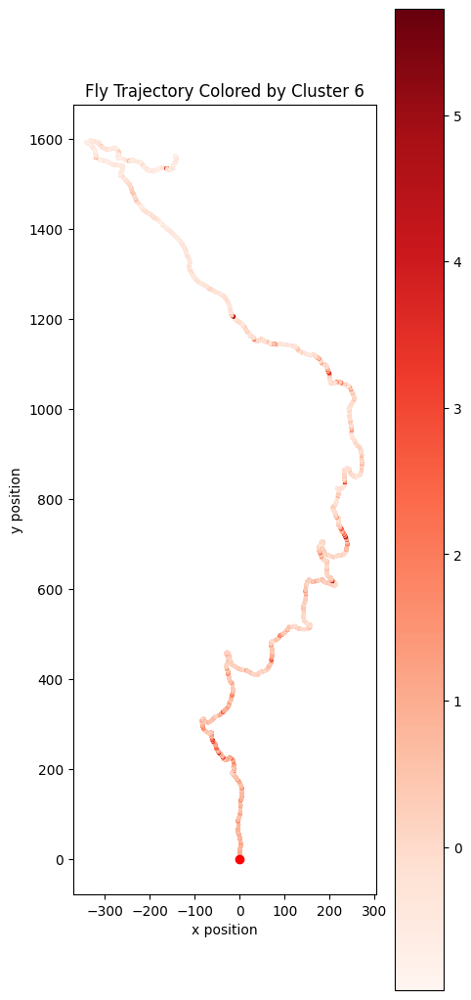

In [113]:
# plot on trajectory
def plot_fly_traj(xPos, yPos, color_var,color_var_name):
    x_range = max(xPos) - min(xPos)
    y_range = max(yPos) - min(yPos)
    aspect_ratio = y_range / x_range

    # Set figure dimensions based on data range while keeping unit scale the same
    fig_width = 5  # Width of figure in inches
    fig_height = fig_width * aspect_ratio  # Height is scaled according to the aspect ratio of the data

    plt.figure(figsize=(fig_width, fig_height))

    plt.scatter(xPos, yPos, s=3, c= color_var,cmap = 'Reds')
    plt.colorbar()
    plt.scatter(0, 0, color='red')  # Mark the origin

    # Enforce equal aspect ratio so that one unit in x is the same as one unit in y
    plt.gca().set_aspect('equal', adjustable='box')

    plt.xlabel('x position')
    plt.ylabel('y position')
    plt.title('Fly Trajectory Colored by '+color_var_name)

plot_fly_traj(xPos, yPos, clus_mean[6], 'Cluster 6')

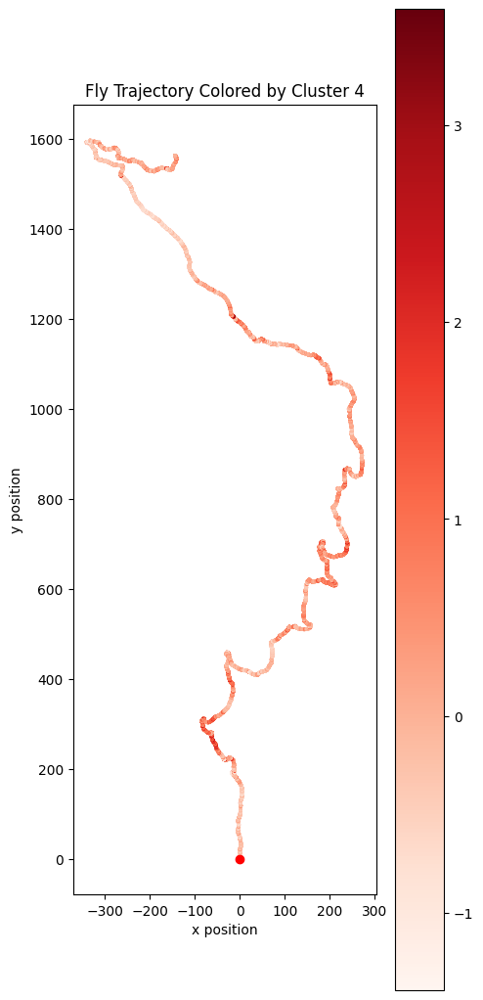

In [114]:
plot_fly_traj(xPos, yPos, clus_mean[4],'Cluster 4')

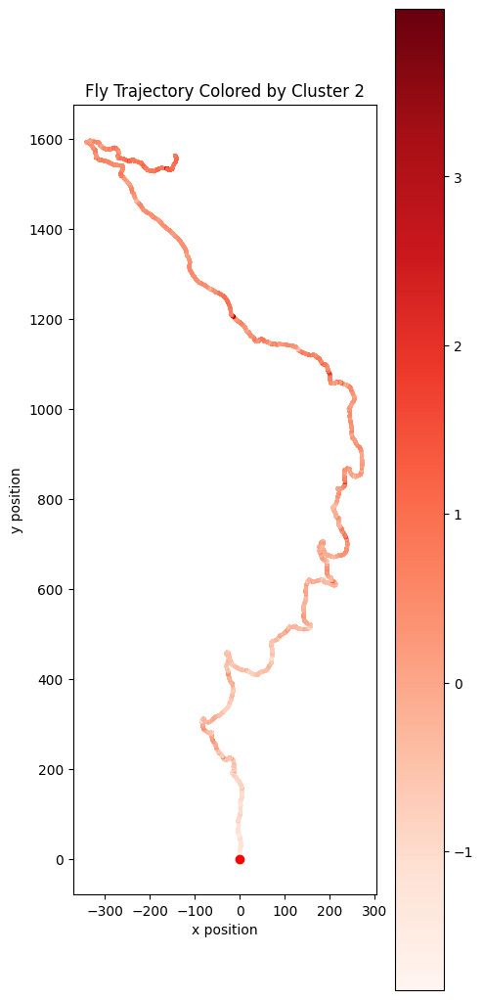

In [115]:
plot_fly_traj(xPos, yPos, clus_mean[2],'Cluster 2')

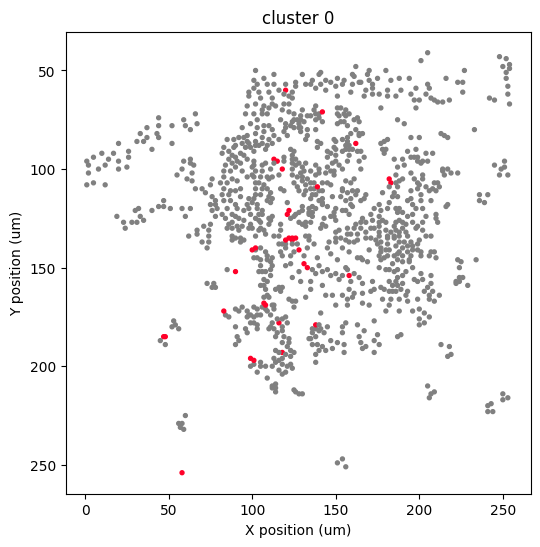

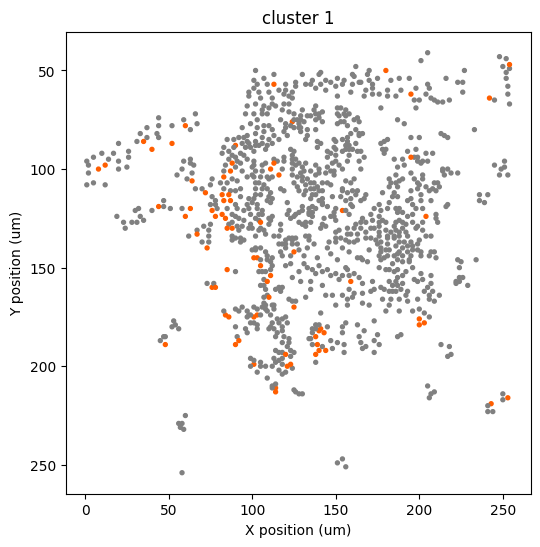

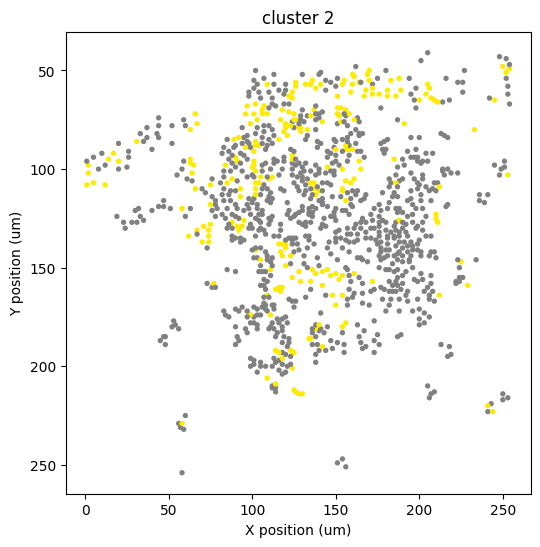

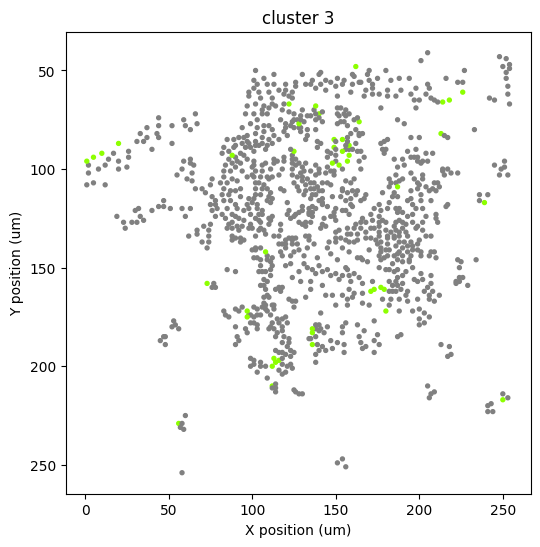

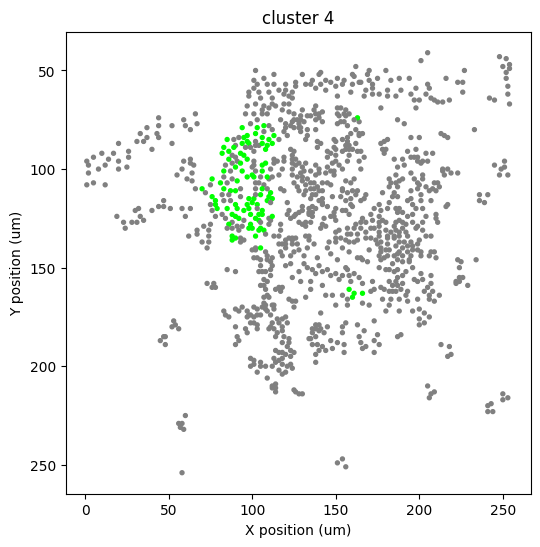

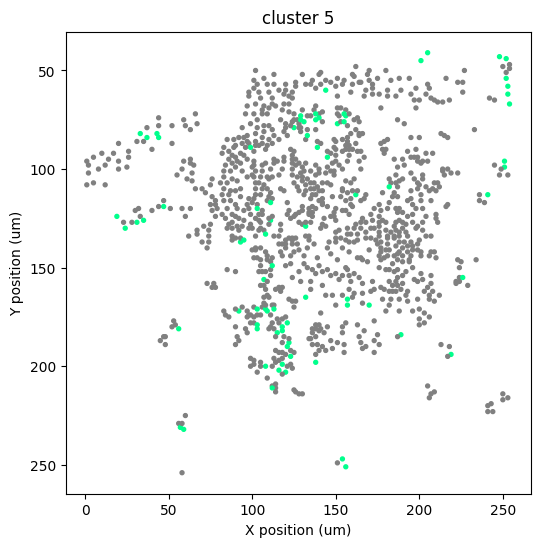

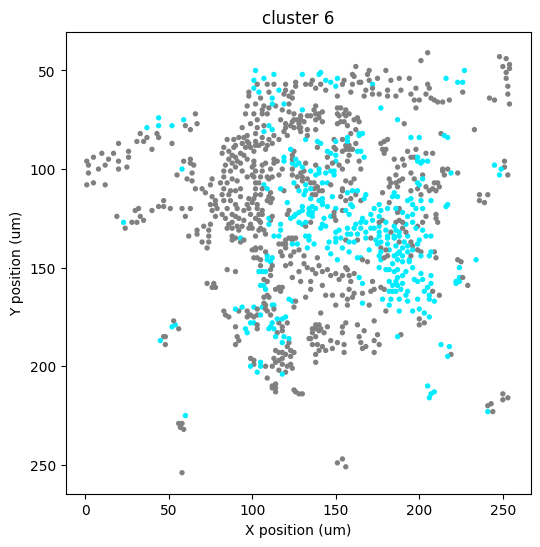

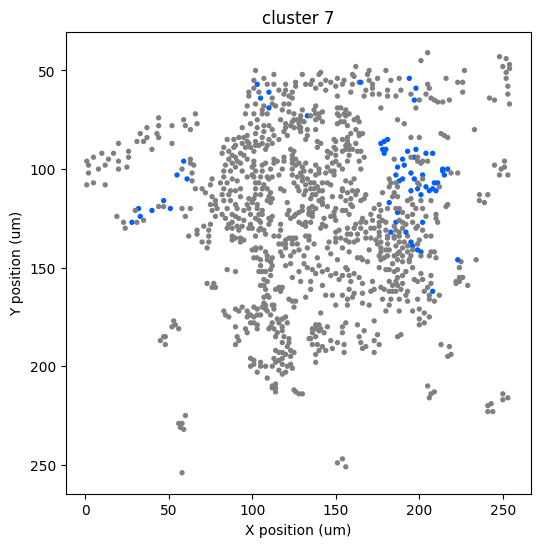

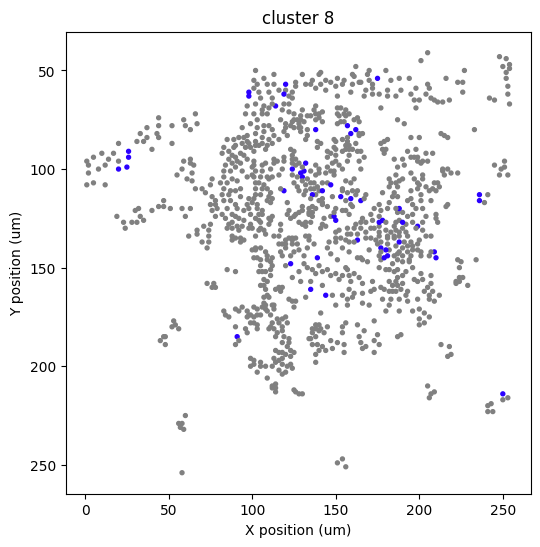

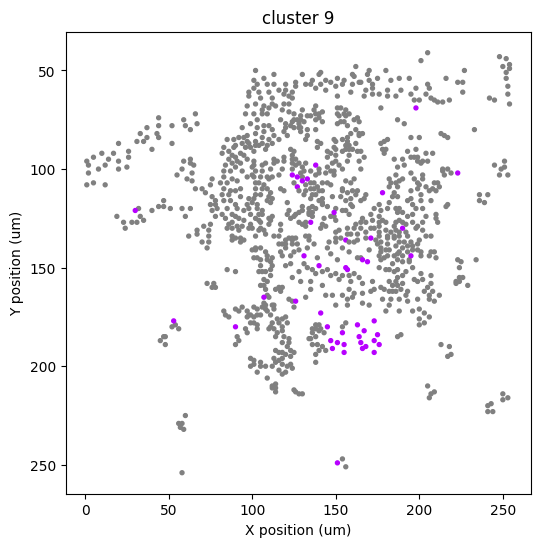

In [23]:
# Assuming cell_classes contains the class for each cell and class_of_interest is the one you want to highlight
def highlight_class(bin_index, mapped_embeddings,highlight_color):
    class_of_interest = bin_index  # Replace 'YourClassHere' with the actual class of interest
    #highlight_color = 'red'  # Replace 'YourHighlightColorHere' with the color you want for the class of interest, e.g., 'red'

    # Correct Approach: Initializing a color array
    colors = np.array(['gray'] * len(mapped_embeddings), dtype=object)  # Initializing with 'gray'

    # Apply highlight_color
    indices_of_interest = np.where(mapped_embeddings == class_of_interest)[0]
    for index in indices_of_interest:
        colors[index] = highlight_color

    # Now plot with the modified colors
    plt.figure(figsize=(6,6))
    plt.scatter(y_pos_cell, x_pos_cell, s=8, c=colors)  # Note: cmap here may not affect the colors since we're manually setting them
    plt.xlabel('X position (um)')
    plt.ylabel('Y position (um)')
    plt.gca().invert_yaxis()
    plt.title(f'cluster {bin_index}')
    #plt.axis("square")
    plt.show()

for i in range(len(unique_val)):
    highlight_class(i, model.embedding_clust,cmap(i / len(unique_val)))

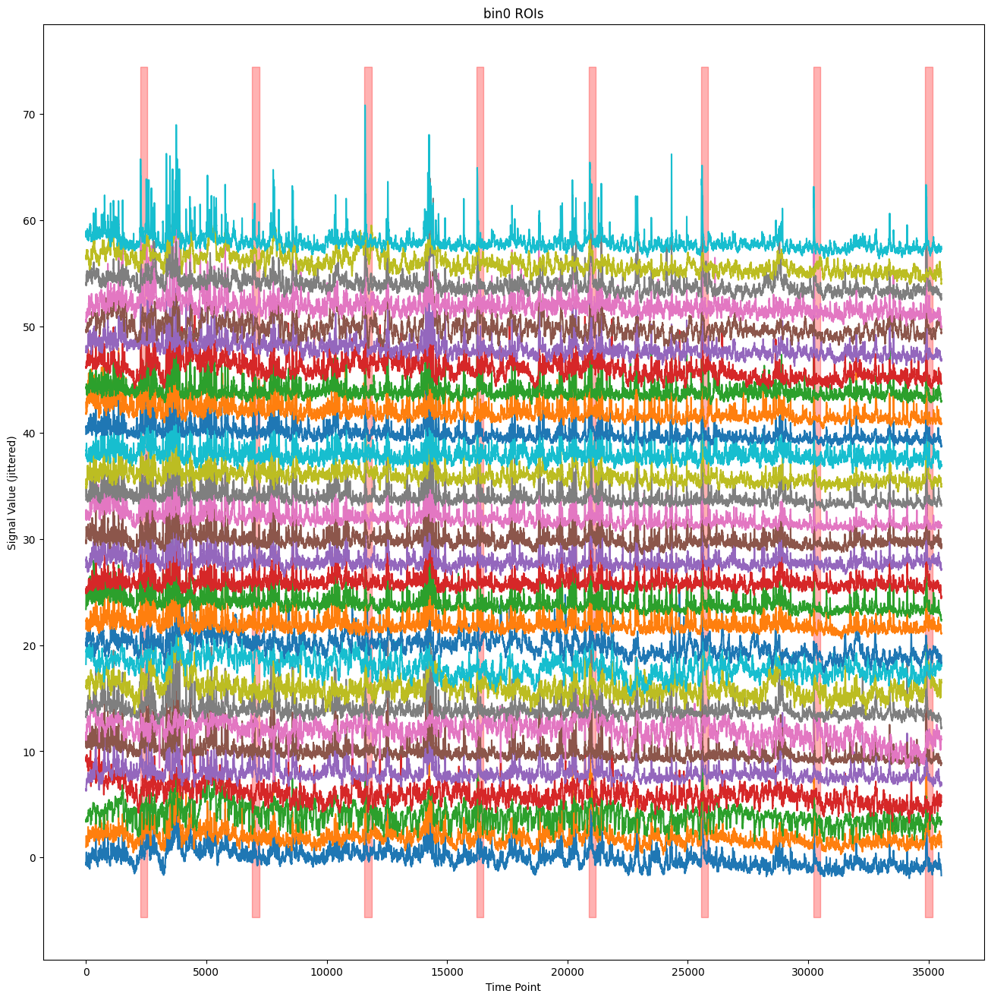

In [144]:
fig,ax = plt.subplots(figsize=(16, 16))
bin_index = 6
# Plot each signal with a jitter on the y-axis
y_offset = 2  # Adjust the offset value as needed
sn_binx = fl_cell[model.embedding_clust == bin_index]
for i in range(30):
    ax.plot(sn_binx[i,:] + (i * y_offset), label=f'Signal {i+1}')
ax.fill_between(behav_df.index, ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.3)
    
# Add labels and title
plt.xlabel('Time Point')
plt.ylabel('Signal Value (jittered)')
plt.title('bin0 ROIs')

# Optionally, add a legend
#plt.legend()

# Show the plot
plt.show()

In [134]:
# plot around odor delivery
def find_odor_start_end(behav_df):
    odor_on = behav_df[behav_df.odor > 5].index
    odor_start = [odor_on[0]]
    odor_end = []
    for i in range(len(odor_on)-1):
        if odor_on[i+1] - odor_on[i]>5:
            odor_start.append(odor_on[i+1])
            odor_end.append(odor_on[i])
    if odor_on[-1] != len(behav_df)-1:
        odor_end.append(odor_on[-1])
    return odor_start[0:len(odor_end)], odor_end
odor_start, odor_end = find_odor_start_end(behav_df)


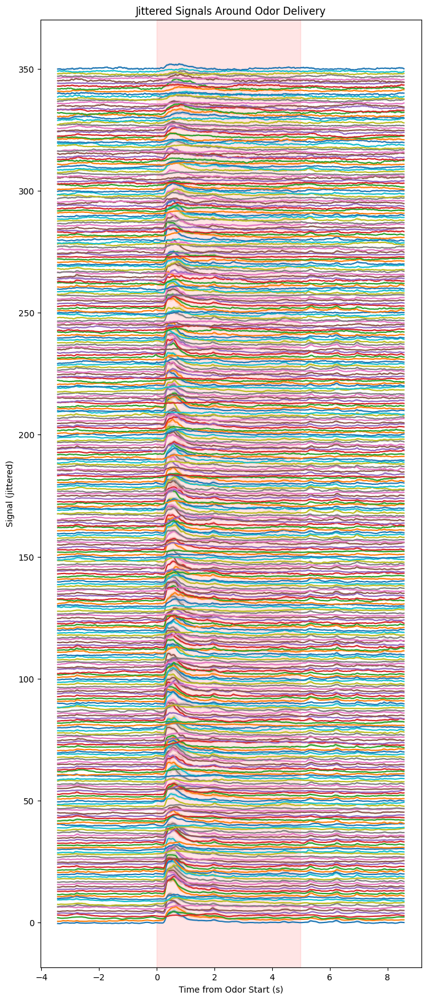

In [145]:
def plot_jittered_signals_around_odor(sn_binx, behav_df, y_jitter):
    """
    Plots all rows of sn_binx in a jittered manner on the y-axis around the odor delivery windows.

    Parameters:
    - sn_binx: 2D numpy array with dimensions (rows, time) representing signals to plot.
    - behav_df: DataFrame containing behavioral data, including time, odor_start, and odor_end.
    - y_jitter: float, the y-offset to apply between each row for clarity.
    """
    fig, ax = plt.subplots(figsize=[8,20])
    odor_start, odor_end = find_odor_start_end(behav_df)
    
    # Loop through each row in sn_binx
    for row_idx in range(sn_binx.shape[0]):
        odor_all = []
        for i in range(len(odor_start)-1):
            ind1 = odor_start[i] - 200
            ind2 = odor_start[i] + 500
            odor_all.append(sn_binx[row_idx, ind1:ind2])
        
        # Calculate mean and standard deviation for odor_all segments
        odor_mean = np.mean(np.array(odor_all), axis=0)
        odor_std = np.std(np.array(odor_all), axis=0) / np.sqrt(len(odor_all))  # Standard Error of the Mean (SEM)
        
        # Plot the mean signal for each row with y-offset
        ax.plot(behav_df.time[ind1:ind2] - behav_df.time[odor_start[i]], odor_mean + (row_idx * y_jitter), label=f'Row {row_idx}')
        
        # Optional: Add fill_between for SEM or STD
        ax.fill_between(behav_df.time[ind1:ind2] - behav_df.time[odor_start[i]],
                         odor_mean - odor_std + (row_idx * y_jitter),
                         odor_mean + odor_std + (row_idx * y_jitter), alpha=0.2)

    # Highlight the odor delivery window
    ax.axvspan(0, behav_df.time[odor_end[0]] - behav_df.time[odor_start[0]], color='red', alpha=0.1)
    
    plt.xlabel('Time from Odor Start (s)')
    plt.ylabel('Signal (jittered)')
    plt.title('Jittered Signals Around Odor Delivery')
    #plt.legend()
plot_jittered_signals_around_odor(sn_binx, behav_df, 1)

In [136]:

def tuning_curve_1d(behavior_variable, neural_activity,neurons_to_plot,num_bins):
# Bin the behavioral variable
    bins = np.linspace(np.min(behavior_variable), np.max(behavior_variable), num_bins+1)
    bin_centers = 0.5 * (bins[1:] + bins[:-1])

    # Initialize a plot
    plt.figure(figsize=(10, 6))

    # Plot tuning curves with 
    #  for selected neurons
    for neuron_index in neurons_to_plot:
        # Bin neural activity based on the behavioral variable
        binned_activity = np.empty(num_bins)
        binned_sem = np.empty(num_bins)  # Array to store the SEM values for each bin
        
        for i in range(num_bins):
            # Find indices of behavior_variable that fall into the current bin
            indices = np.where((behavior_variable >= bins[i]) & (behavior_variable < bins[i+1]))[0]
            # Calculate the mean activity of the current neuron for these indices
            bin_data = neural_activity[neuron_index, indices]
            binned_activity[i] = np.mean(bin_data)
            # Calculate SEM for the current bin
            binned_sem[i] = sem(bin_data)
        
        # Plot mean activity
        plt.plot(bin_centers, binned_activity, label=f'Neuron {neuron_index}')
        # Add SEM shading
        plt.fill_between(bin_centers, binned_activity - binned_sem, binned_activity + binned_sem, alpha=0.3)

    # Beautifying the plot
    plt.xlabel(behavior_variable.name)
    plt.ylabel('Average Neural Activity')
    plt.legend()
    plt.title('Neural Activity Tuning Curves with SEM')
    plt.show()
#tuning_curve_1d(behavior_variable, neural_activity,neurons_to_plot,num_bins)

In [137]:
# Bin the behavioral variable
#num_bins = 10  # Number of bins for the behavioral variable
def tuning_curve_pop(num_bins, behavior_variable, neural_activity):
    bins = np.linspace(np.min(behavior_variable), np.max(behavior_variable), num_bins+1)
    bin_centers = 0.5 * (bins[1:] + bins[:-1])

    # Initialize an array to hold the mean activity for each neuron across bins
    mean_activity_matrix = np.zeros((neural_activity.shape[0], num_bins))

    # Calculate the mean activity for each neuron in each bin
    for i in range(neural_activity.shape[0]):  # Loop over neurons
        for j in range(num_bins):  # Loop over bins
            # Find indices of behavior_variable that fall into the current bin
            indices = np.where((behavior_variable >= bins[j]) & (behavior_variable < bins[j+1]))[0]
            # Calculate the mean activity of the current neuron for these indices
            if len(indices) > 0:
                mean_activity_matrix[i, j] = np.mean(neural_activity[i, indices])
            else:
                mean_activity_matrix[i, j] = np.nan  # Use NaN for bins with no data points

    # Fixed figure width
    fig_width = 10  # Fixed width for all figures
    
    # Adjustable figure height based on the matrix height, smaller relative to width
    height_scale_factor = 0.02  # Smaller scale factor for height
    min_height = 2  # Minimum height to ensure figure is not too small
    fig_height = max(min_height, neural_activity.shape[0] * height_scale_factor)

    # Plotting the heatmap
    plt.figure(figsize=(fig_width, fig_height))
    plt.imshow(mean_activity_matrix, aspect='auto', cmap='viridis',
            extent=[bins[0], bins[-1], 0, neural_activity.shape[0]])
    plt.colorbar(label='Average Neural Activity')
    plt.xlabel(behavior_variable.name)
    plt.ylabel('Neurons')
    plt.title('Neural Activity Tuning Curves Heatmap')
    plt.show()
#tuning_curve_pop(num_bins, behavior_variable, neural_activity)

In [138]:

def filter_based_on_histogram(behavior_variable, min_freq_threshold):
    """
    Filters the behavioral variable data to remove points distant from the main mode,
    isolated by at least two consecutive bins with very low frequency. Automatically adjusts
    bins based on the Freedman-Diaconis rule.
    
    Parameters:
    - behavior_variable: Pandas Series, the behavioral variable data.
    - min_freq_threshold: The minimum frequency (as a proportion of total) to consider a bin as non-negligible.
    
    Returns:
    - Pandas Series, filtered behavioral variable data.
    """
    # Calculate bin width using the Freedman-Diaconis rule
    #IQR = np.subtract(*np.percentile(behavior_variable, [75, 25]))
    #n = len(behavior_variable)
    bin_width = 1
    range_ = np.max(behavior_variable) - np.min(behavior_variable)
    bins = int(np.round(range_ / bin_width))
    print(bins)
    # Compute the histogram with the calculated number of bins
    counts, bin_edges = np.histogram(behavior_variable, bins=bins)
    #total_points = n
    #freqs = counts / total_points  # Frequency of each bin
    
    # Identify bins below the frequency threshold
    low_freq_bins_mask = counts < min_freq_threshold
    
    # Find indices where two consecutive bins are below the threshold
    two_consecutive_low_bins = np.where(np.convolve(low_freq_bins_mask, [1,1], mode='valid') == 2)[0]
    
    if two_consecutive_low_bins.size == 0:
        return behavior_variable  # No such consecutive low bins, return original series
    
    # Determine cutoffs
    mode_bin_index = np.argmax(counts)
    lower_cutoff_bins = two_consecutive_low_bins[two_consecutive_low_bins < mode_bin_index]
    upper_cutoff_bins = two_consecutive_low_bins[two_consecutive_low_bins > mode_bin_index]
    lower_cutoff = bin_edges[0] if lower_cutoff_bins.size == 0 else bin_edges[lower_cutoff_bins.max() + 2]  # +2 to include the low bin
    upper_cutoff = bin_edges[-1] if upper_cutoff_bins.size == 0 else bin_edges[upper_cutoff_bins.min()]
    
    # Filter the behavioral variable
    filtered_variable = behavior_variable[(behavior_variable >= lower_cutoff) & (behavior_variable <= upper_cutoff)]
    
    return filtered_variable
# Example usage:

27
252
56
6


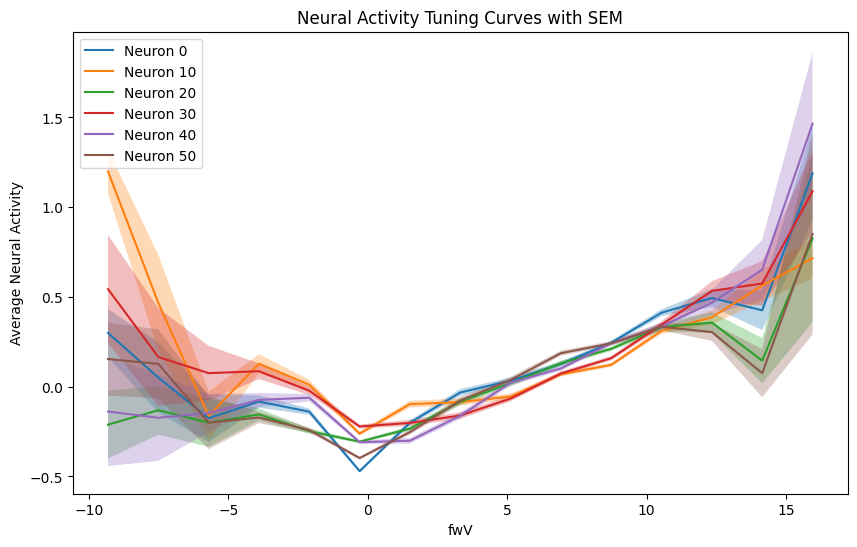

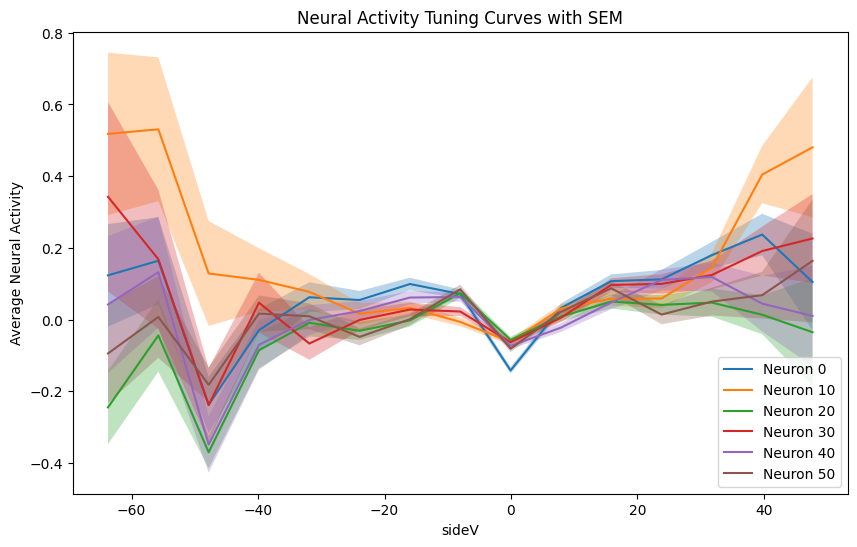

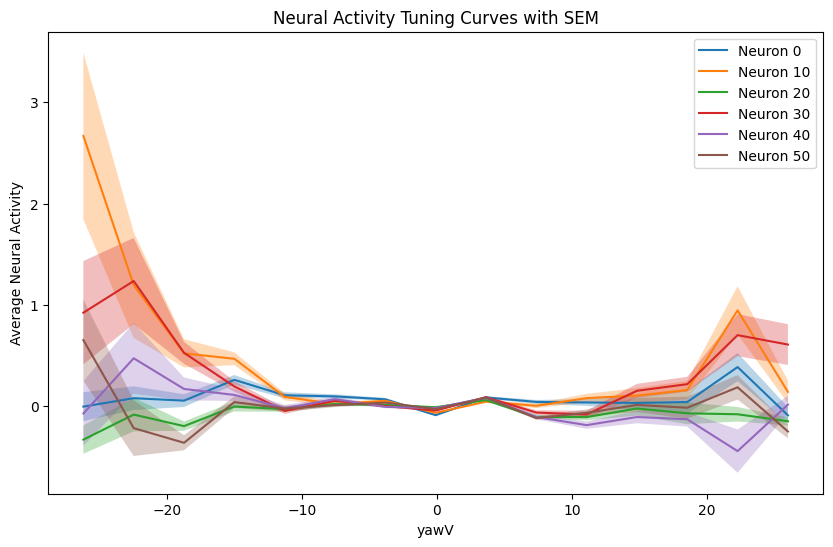

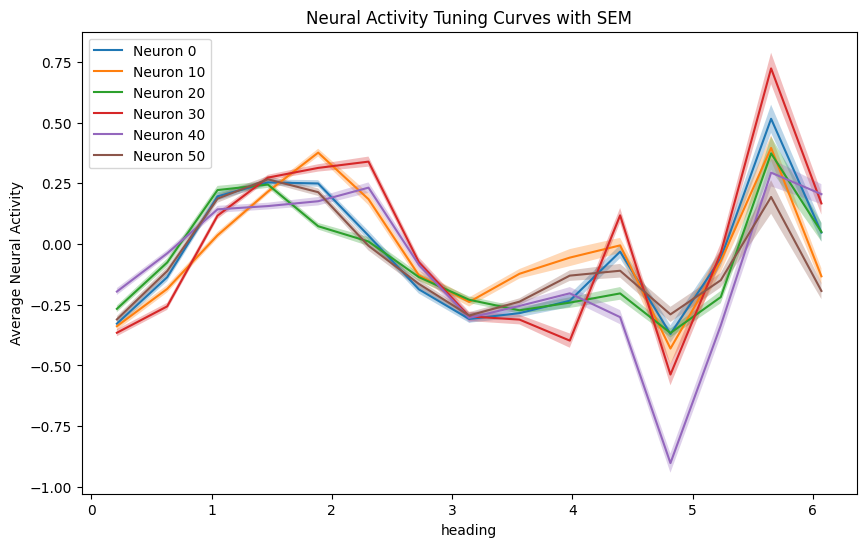

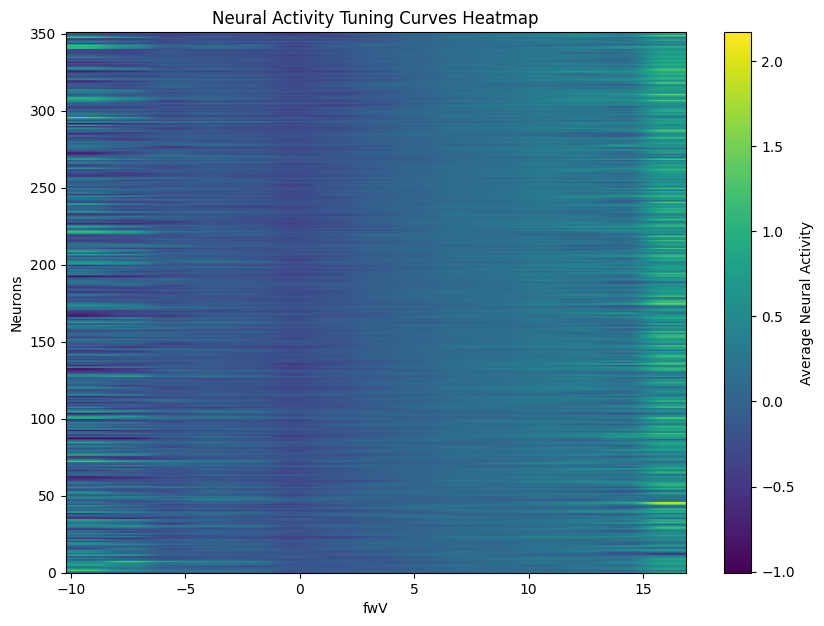

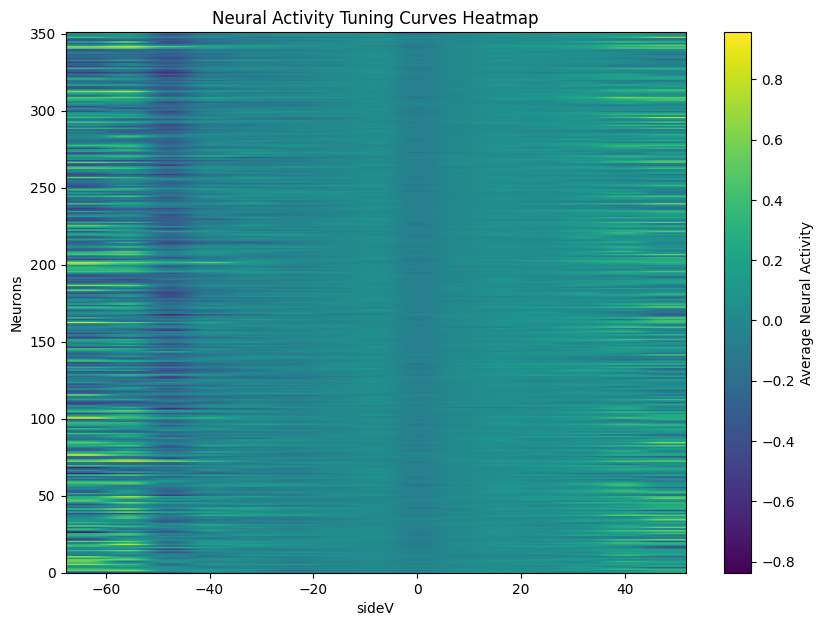

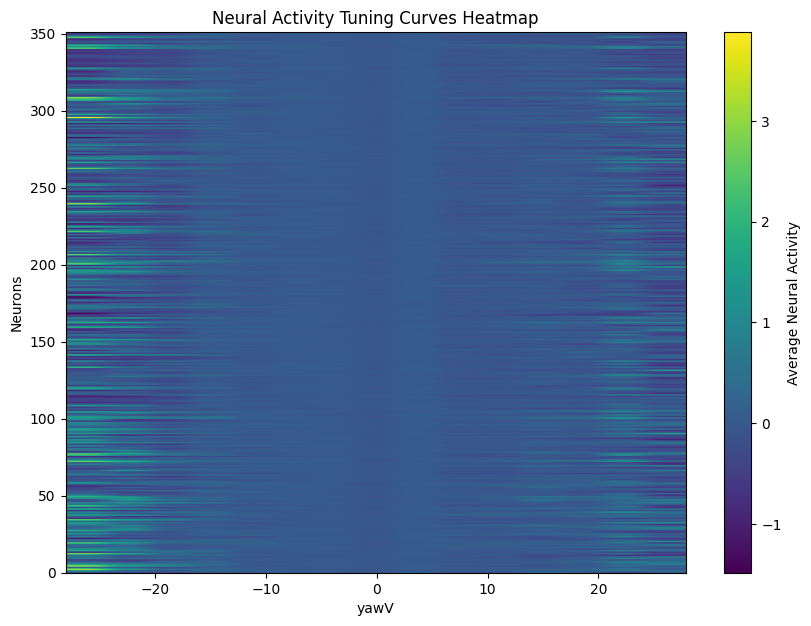

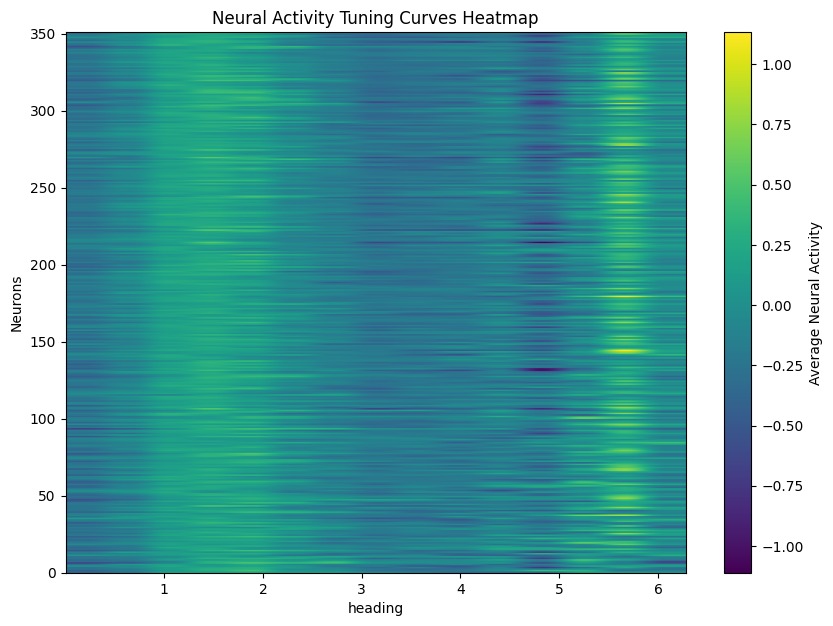

In [148]:
# Determine the number of rows and columns for the subplot grid
behavioral_variables = [behav_df.fwV, behav_df.sideV, behav_df.yawV, behav_df.heading]
filtered_behavior_variables = [filter_based_on_histogram(var, 0.5) for var in behavioral_variables]
neural_activity = sn_binx
num_bins = 15
neurons_to_plot = [0, 10, 20, 30, 40, 50]
num_behavioral_variables = len(filtered_behavior_variables)
for i, behavior_variable in enumerate(filtered_behavior_variables):
    tuning_curve_1d(behavior_variable, neural_activity,neurons_to_plot,num_bins)
    
# Loop through behavioral variables and plot
for i, behavior_variable in enumerate(filtered_behavior_variables):
    tuning_curve_pop(num_bins, behavior_variable, neural_activity)


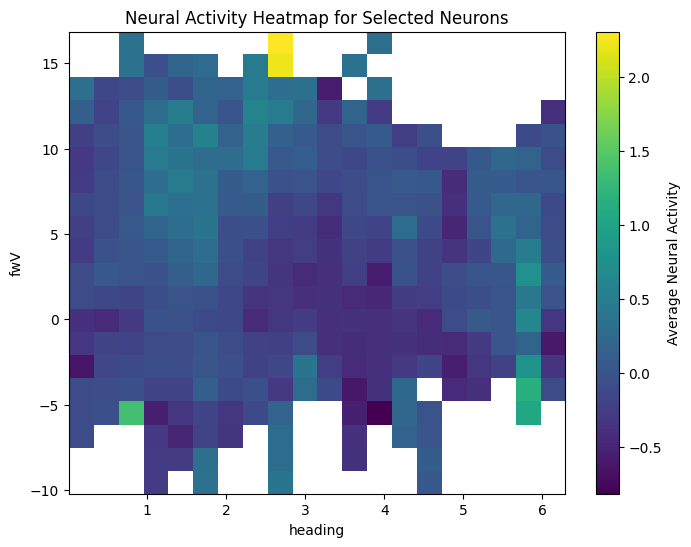

In [214]:
def tuning_curve_2d(behavior_variable_1, behavior_variable_2, neural_activity,neuron_index,num_bins_1,num_bins_2):
# Create bins for both behavioral variables
    bins_1 = np.linspace(np.min(behavior_variable_1), np.max(behavior_variable_1), num_bins_1 + 1)
    bins_2 = np.linspace(np.min(behavior_variable_2), np.max(behavior_variable_2), num_bins_2 + 1)

    # Initialize an array to hold the mean activity for each bin combination
    mean_activity_matrix = np.zeros((num_bins_1, num_bins_2))

    # Calculate the mean activity for each bin combination
    for i in range(num_bins_1):
        for j in range(num_bins_2):
            # Find indices that fall into the current bin combination
            indices = np.where((behavior_variable_1 >= bins_1[i]) & (behavior_variable_1 < bins_1[i+1]) &
                            (behavior_variable_2 >= bins_2[j]) & (behavior_variable_2 < bins_2[j+1]))[0]
            # Calculate mean activity for these indices
            if len(indices) > 0:
                #print(indices)
                mean_activity_matrix[i, j] = np.mean(neural_activity[:, indices][neuron_index,:])
            else:
                mean_activity_matrix[i, j] = np.nan  # Use NaN for bins with no data points

    # Plotting the heatmap
    plt.figure(figsize=(8, 6))
    plt.imshow(mean_activity_matrix, origin='lower', aspect='auto', cmap='viridis',
            extent=[bins_2[0], bins_2[-1], bins_1[0], bins_1[-1]])
    plt.colorbar(label='Average Neural Activity')
    plt.xlabel(behavior_variable_2.name)
    plt.ylabel(behavior_variable_1.name)
    plt.title(f'Neural Activity Heatmap for Selected Neurons')
    plt.show()
tuning_curve_2d(behav_df.fwV, behav_df.heading, neural_activity,random.sample(range(0, neural_activity.shape[0]), 351),20,20)

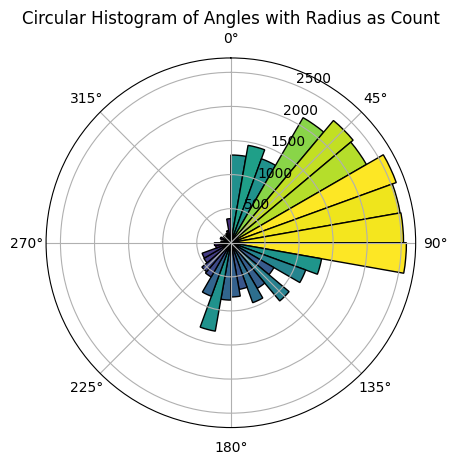

In [83]:
# Create the histogram
num_bins = 36  # For example, dividing the circle into 36 bins (each bin covers 10 degrees)
hist, bin_edges = np.histogram(behav_df.heading, bins=num_bins, range=(0, 2*np.pi))

# Convert bin edges to radians and center each bin
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Plotting
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
bars = ax.bar(bin_centers, hist, width=2*np.pi/num_bins, edgecolor='black')

# Optional: Use a color map
for bar in bars:
    bar.set_facecolor(plt.cm.viridis(bar.get_height() / max(hist)))

# Customizing the plot
ax.set_theta_zero_location('N')  # Zero at the top
ax.set_theta_direction(-1)  # Clockwise
ax.set_title('Circular Histogram of Angles with Radius as Count')

plt.show()

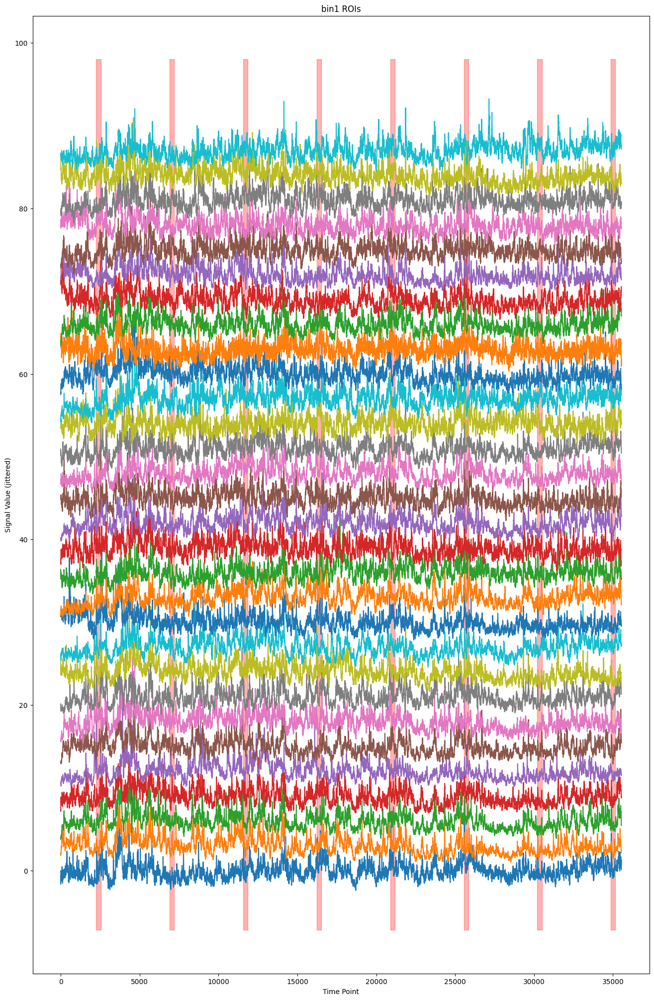

In [228]:
fig,ax = plt.subplots(figsize=(16, 25))
bin_index = 4
# Plot each signal with a jitter on the y-axis
y_offset = 3 # Adjust the offset value as needed
sn_binx = fl_cell[model.embedding_clust == bin_index]
for i in range(30):
    ax.plot(sn_binx[i,:] + (i * y_offset), label=f'Signal {i+1}')
ax.fill_between(behav_df.index, ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.3)
    
# Add labels and title
plt.xlabel('Time Point')
plt.ylabel('Signal Value (jittered)')
plt.title('bin1 ROIs')

# Optionally, add a legend
#plt.legend()

# Show the plot
plt.show()

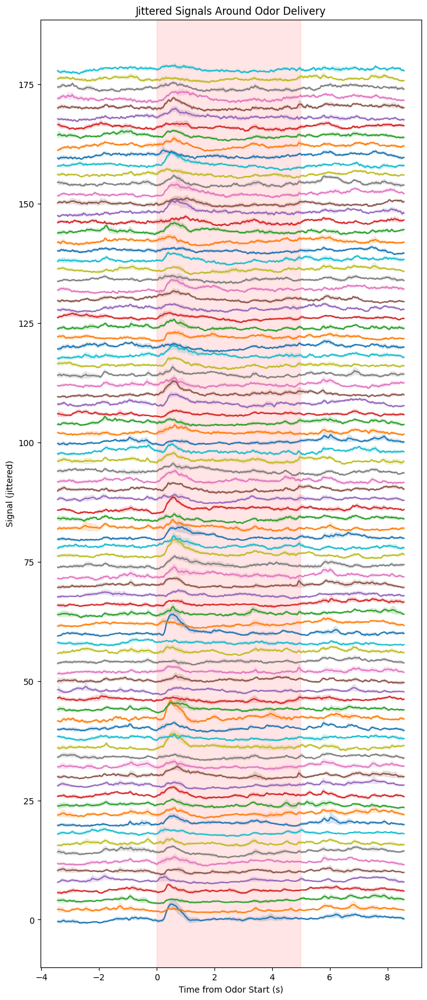

In [229]:
plot_jittered_signals_around_odor(sn_binx, behav_df, 2)

27
252
56
6


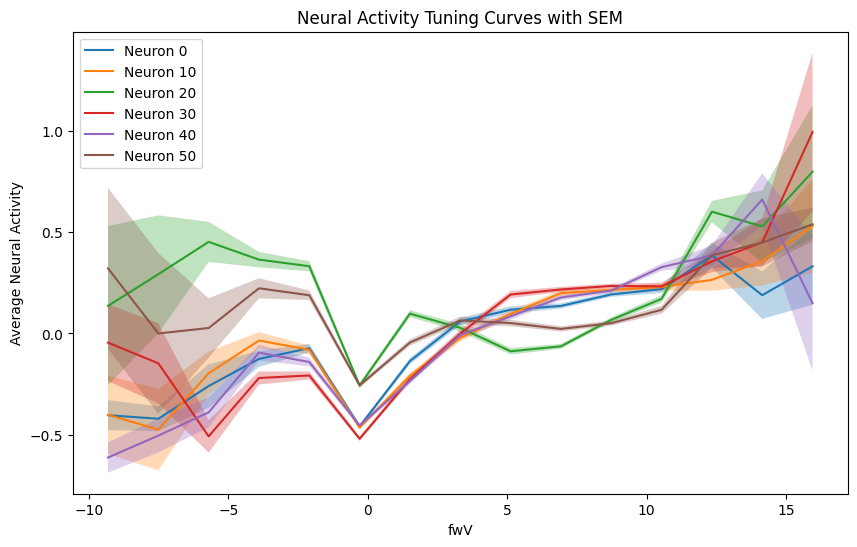

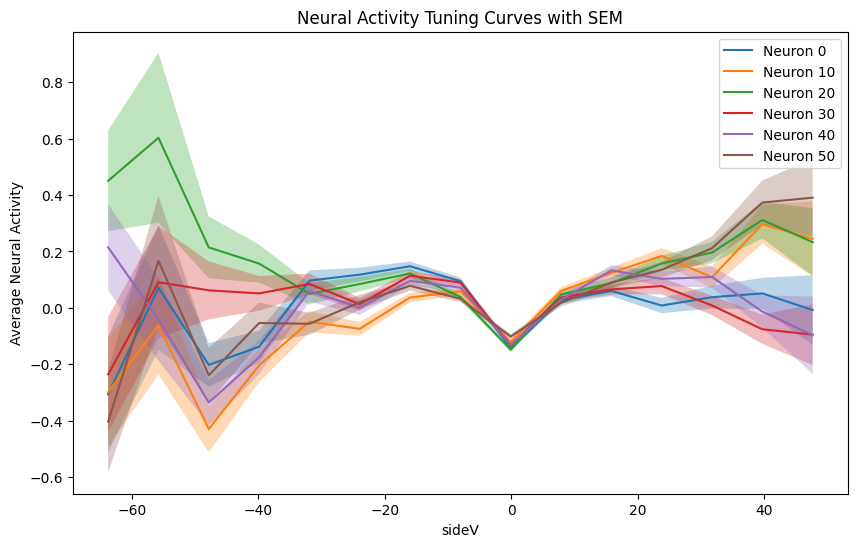

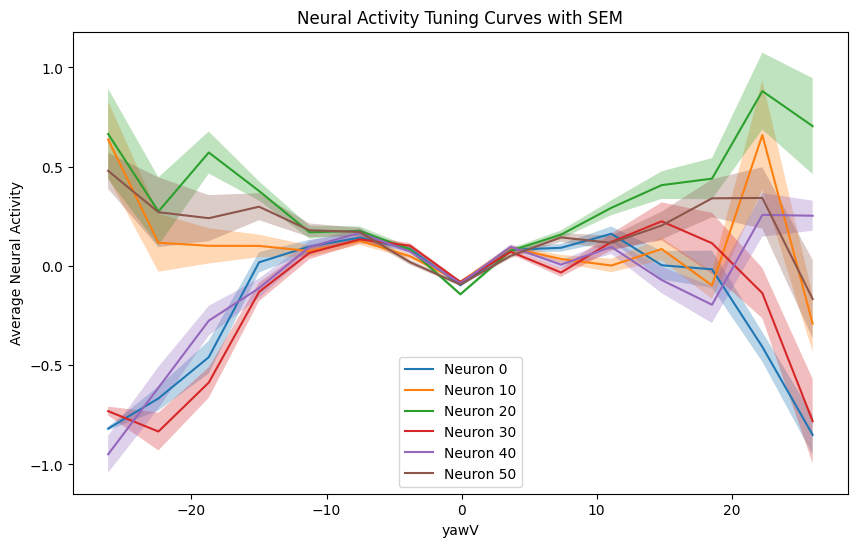

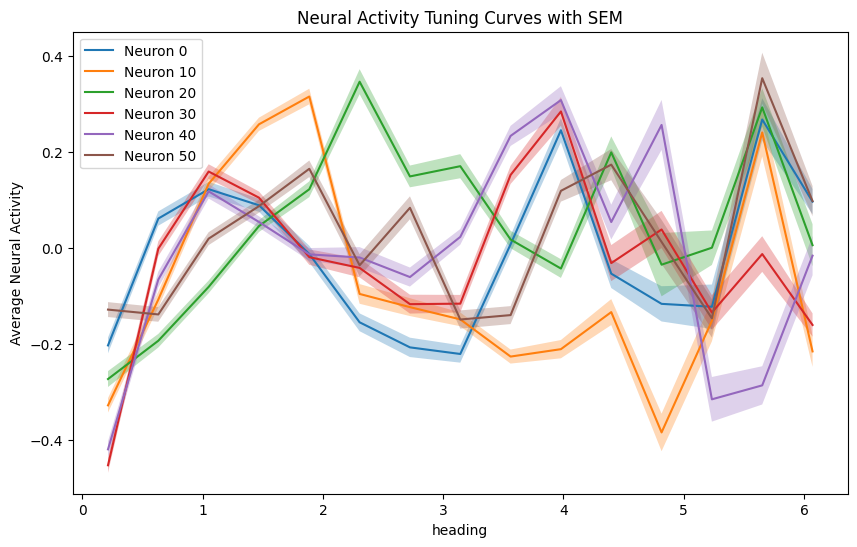

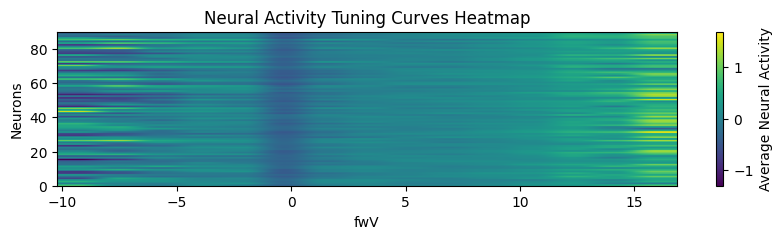

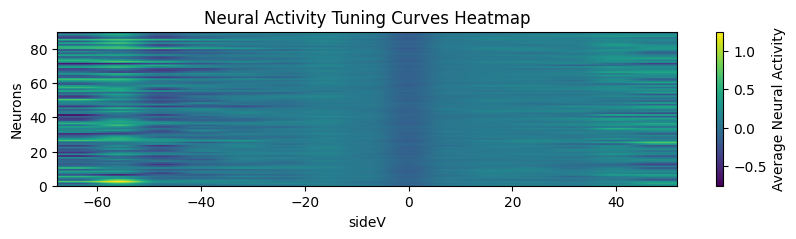

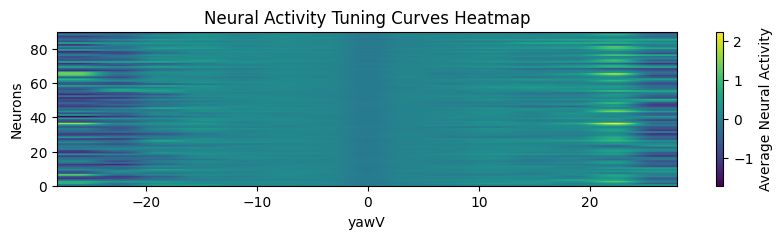

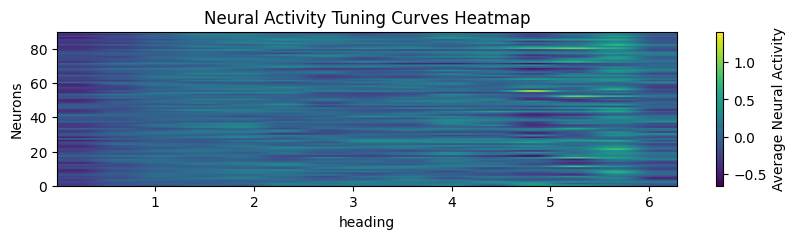

In [230]:
# Determine the number of rows and columns for the subplot grid
behavioral_variables = [behav_df.fwV, behav_df.sideV, behav_df.yawV, behav_df.heading]
filtered_behavior_variables = [filter_based_on_histogram(var, 0.5) for var in behavioral_variables]
neural_activity = sn_binx
num_bins = 15
neurons_to_plot = [0, 10, 20, 30, 40, 50]
num_behavioral_variables = len(filtered_behavior_variables)
for i, behavior_variable in enumerate(filtered_behavior_variables):
    tuning_curve_1d(behavior_variable, neural_activity,neurons_to_plot,num_bins)
# Loop through behavioral variables and plot
for i, behavior_variable in enumerate(filtered_behavior_variables):
    tuning_curve_pop(num_bins, behavior_variable, neural_activity)




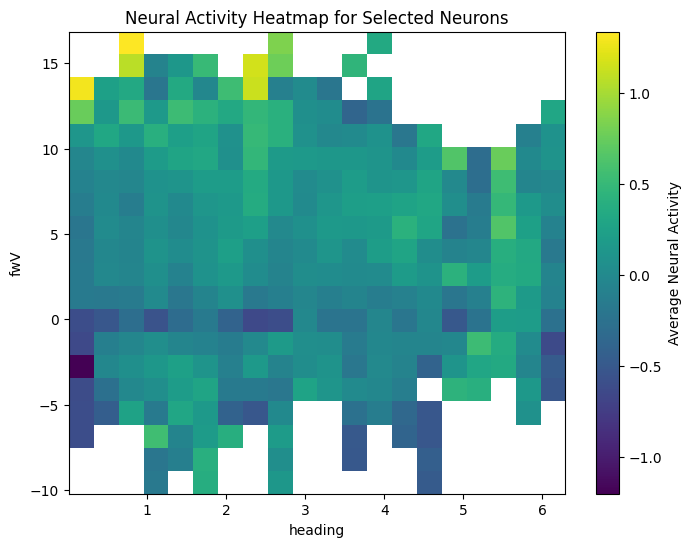

In [231]:
tuning_curve_2d(behav_df.fwV, behav_df.heading, neural_activity,random.sample(range(0, neural_activity.shape[0]), 80),20,20)

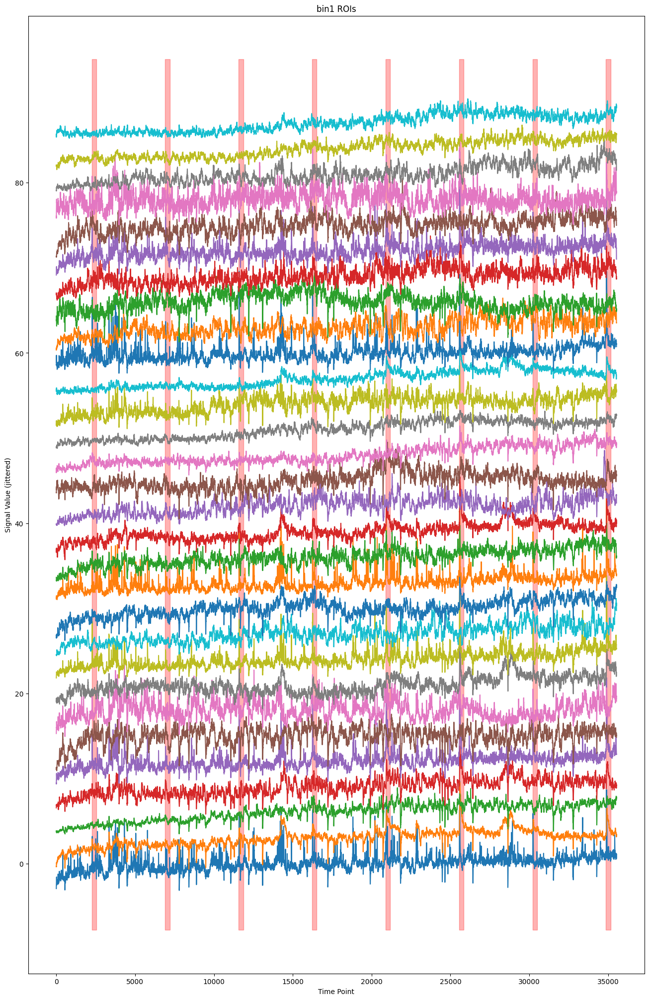

In [220]:
fig,ax = plt.subplots(figsize=(16, 25))
bin_index = 2
# Plot each signal with a jitter on the y-axis
y_offset = 3 # Adjust the offset value as needed
sn_binx = fl_cell[model.embedding_clust == bin_index]
for i in range(30):
    ax.plot(sn_binx[i,:] + (i * y_offset), label=f'Signal {i+1}')
ax.fill_between(behav_df.index, ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.3)
    
# Add labels and title
plt.xlabel('Time Point')
plt.ylabel('Signal Value (jittered)')
plt.title('bin1 ROIs')

# Optionally, add a legend
#plt.legend()

# Show the plot
plt.show()

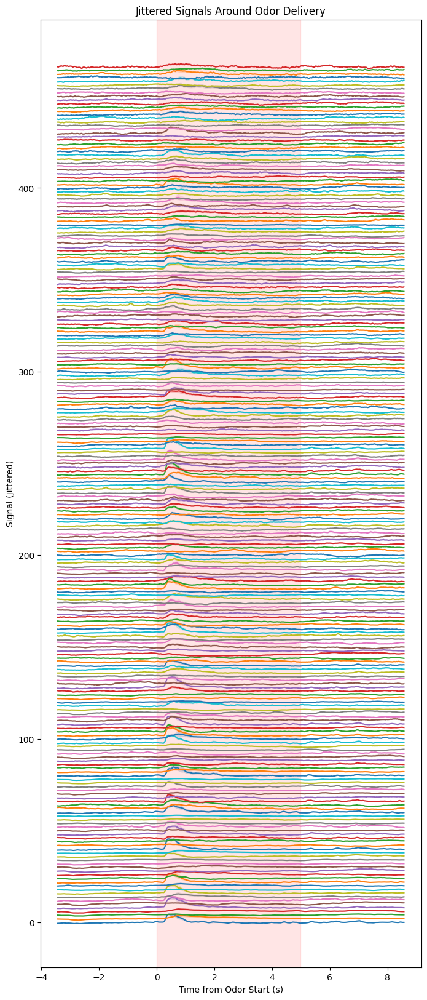

In [221]:
plot_jittered_signals_around_odor(sn_binx, behav_df, 2)

27
252
56
6


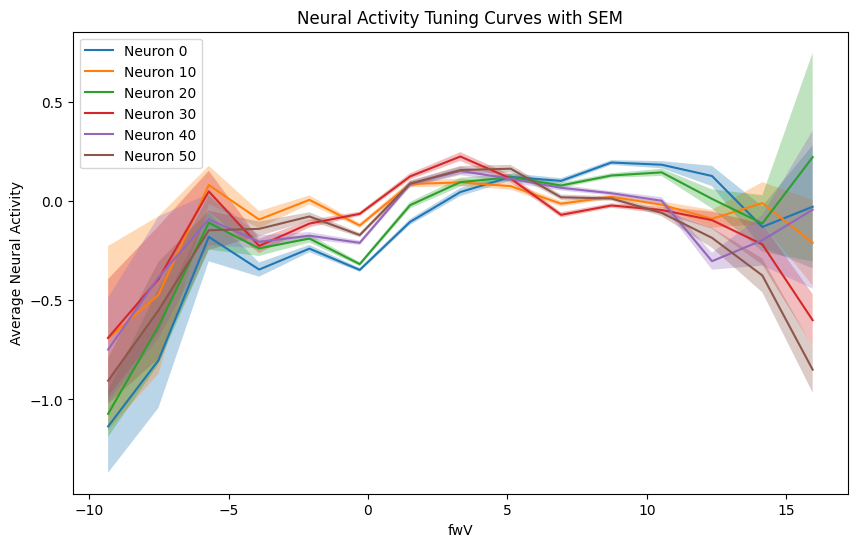

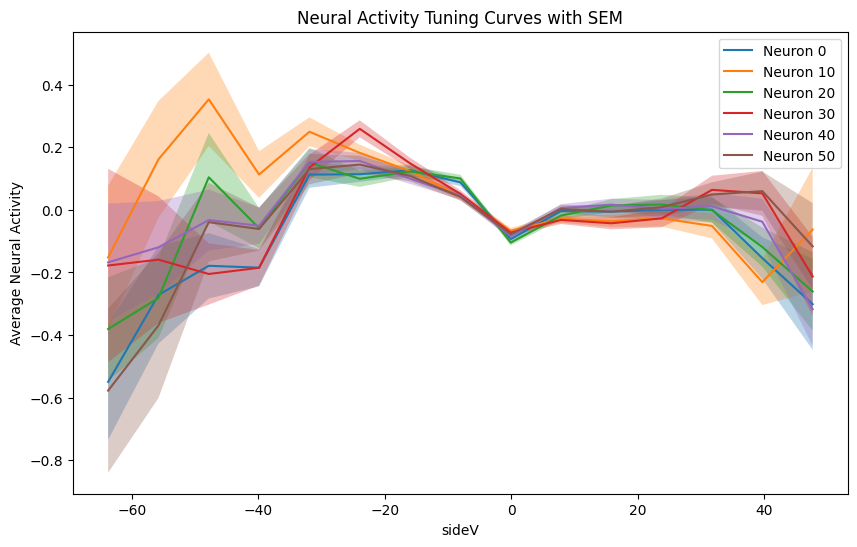

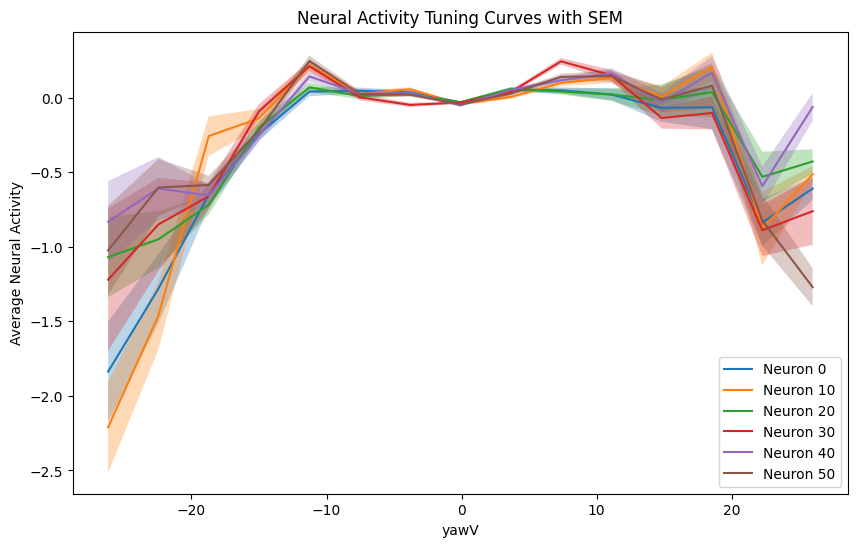

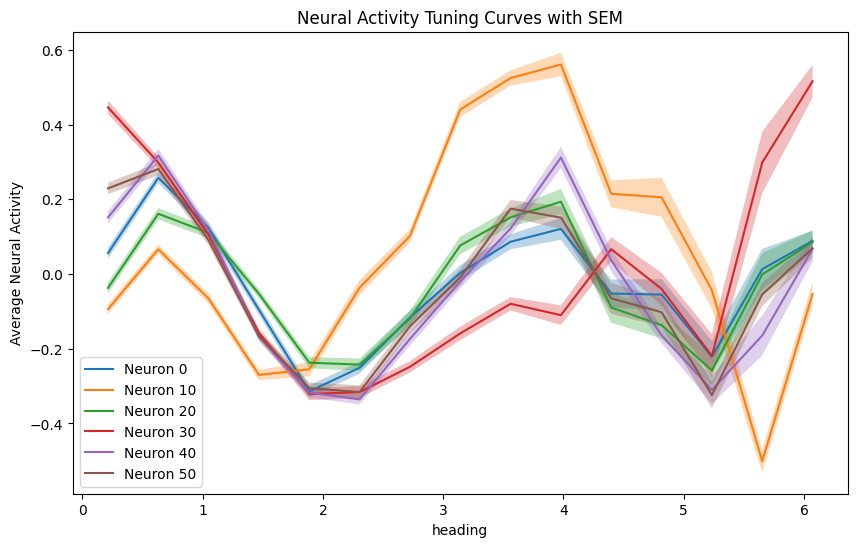

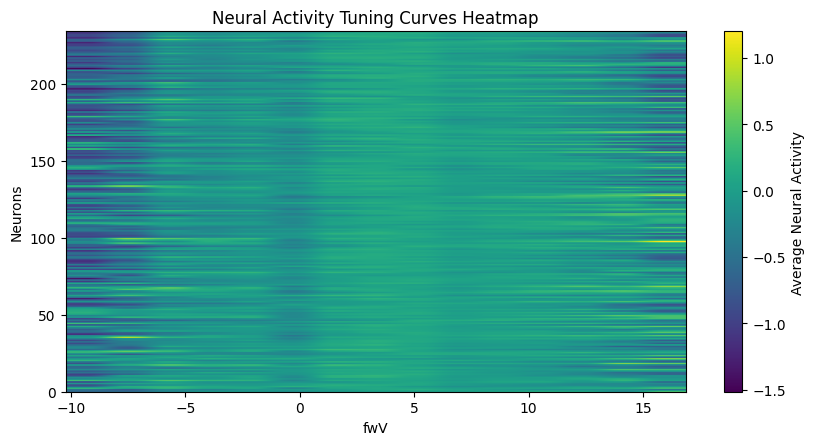

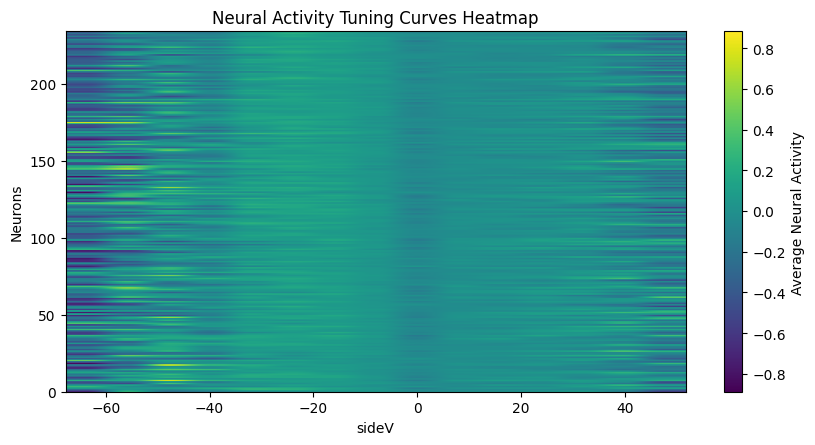

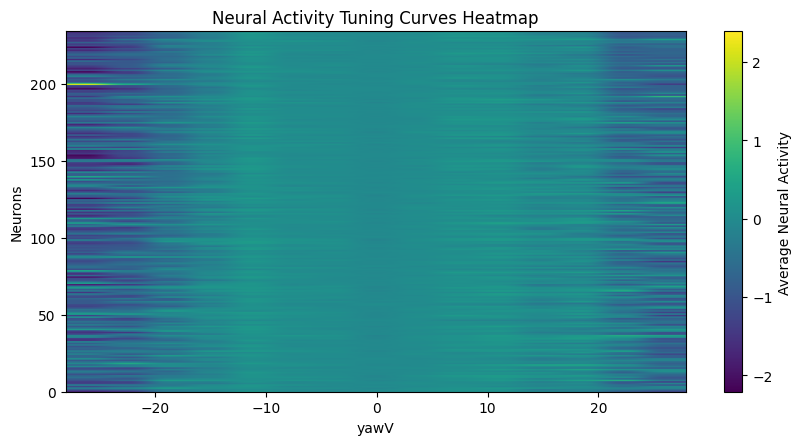

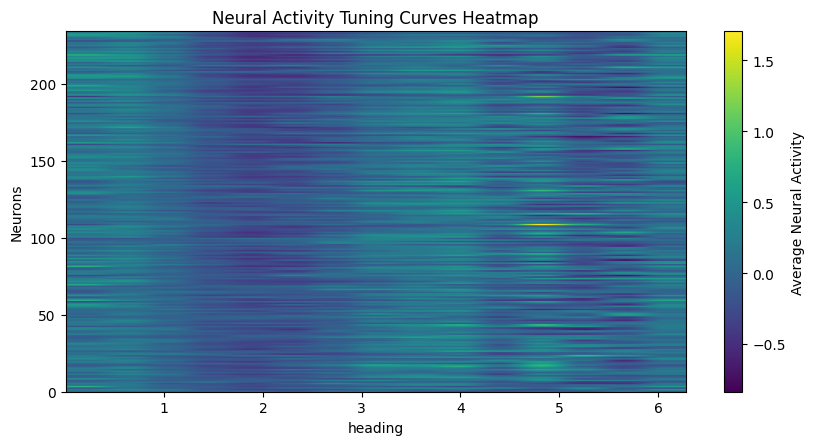

In [224]:
# Determine the number of rows and columns for the subplot grid
behavioral_variables = [behav_df.fwV, behav_df.sideV, behav_df.yawV, behav_df.heading]
filtered_behavior_variables = [filter_based_on_histogram(var, 0.5) for var in behavioral_variables]
neural_activity = sn_binx
num_bins = 15
neurons_to_plot = [0, 10, 20, 30, 40, 50]
num_behavioral_variables = len(filtered_behavior_variables)
for i, behavior_variable in enumerate(filtered_behavior_variables):
    tuning_curve_1d(behavior_variable, neural_activity,neurons_to_plot,num_bins)
# Loop through behavioral variables and plot
for i, behavior_variable in enumerate(filtered_behavior_variables):
    tuning_curve_pop(num_bins, behavior_variable, neural_activity)



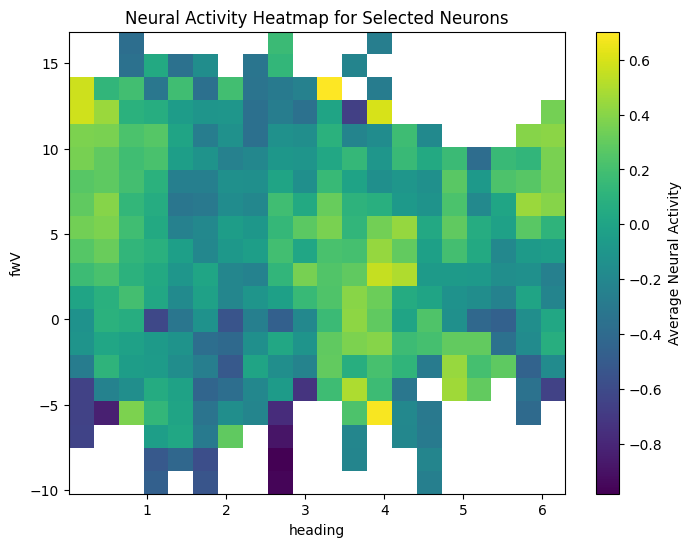

In [227]:
tuning_curve_2d(behav_df.fwV, behav_df.heading, neural_activity,random.sample(range(0, neural_activity.shape[0]), 234),20,20)

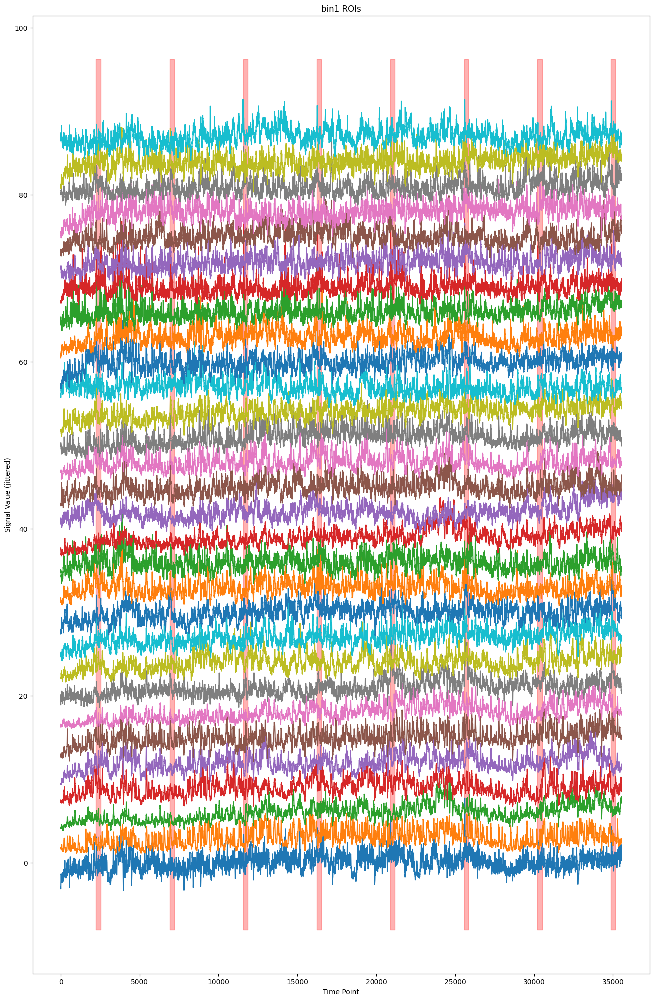

In [232]:
fig,ax = plt.subplots(figsize=(16, 25))
bin_index = 1
# Plot each signal with a jitter on the y-axis
y_offset = 3 # Adjust the offset value as needed
sn_binx = fl_cell[model.embedding_clust == bin_index]
for i in range(30):
    ax.plot(sn_binx[i,:] + (i * y_offset), label=f'Signal {i+1}')
ax.fill_between(behav_df.index, ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.3)
    
# Add labels and title
plt.xlabel('Time Point')
plt.ylabel('Signal Value (jittered)')
plt.title('bin1 ROIs')

# Optionally, add a legend
#plt.legend()

# Show the plot
plt.show()

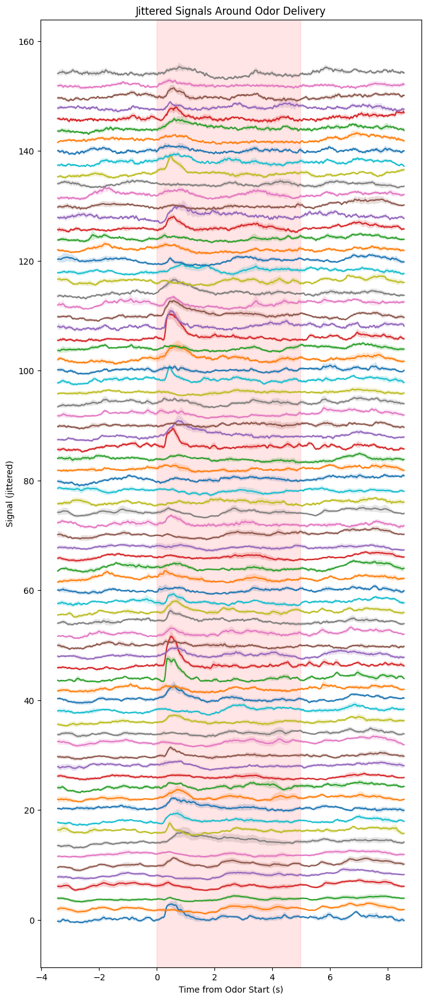

In [233]:
plot_jittered_signals_around_odor(sn_binx, behav_df, 2)

27
252
56
6


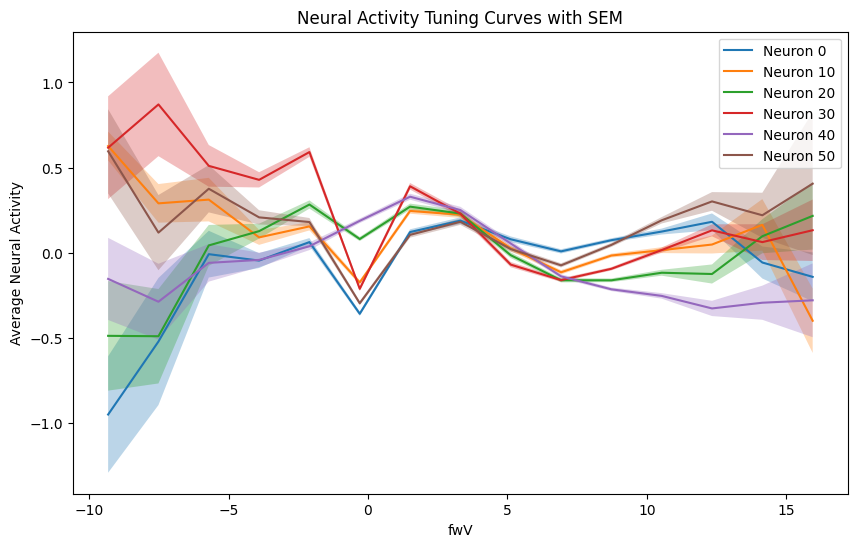

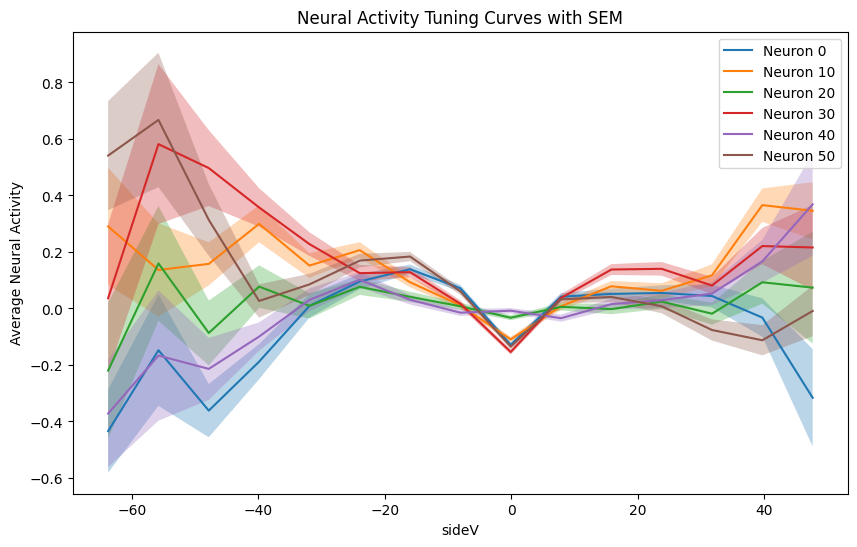

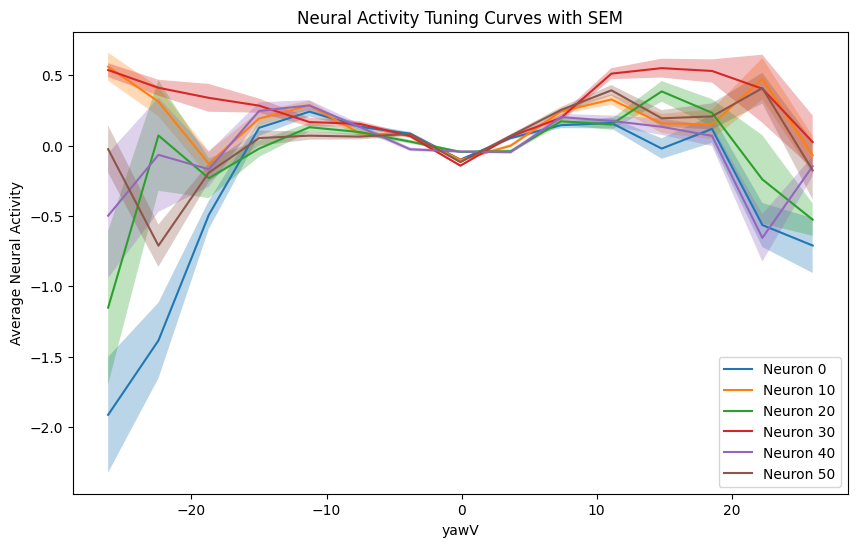

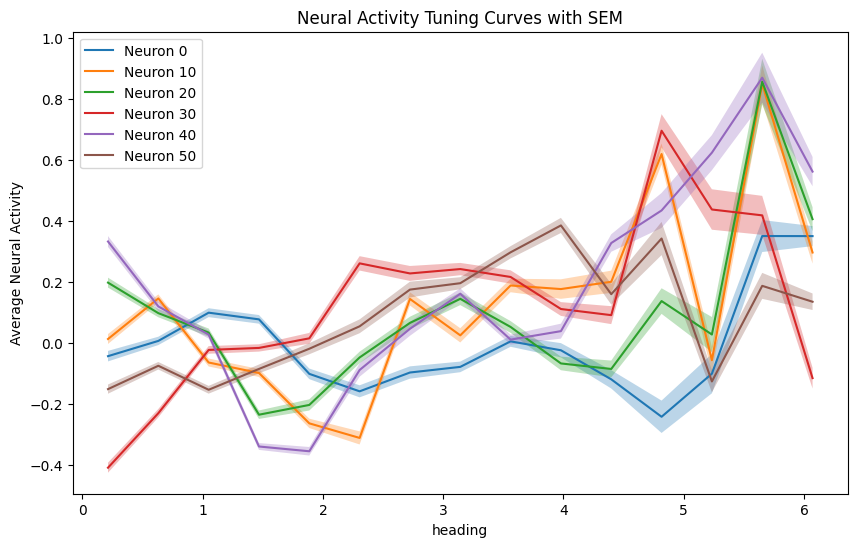

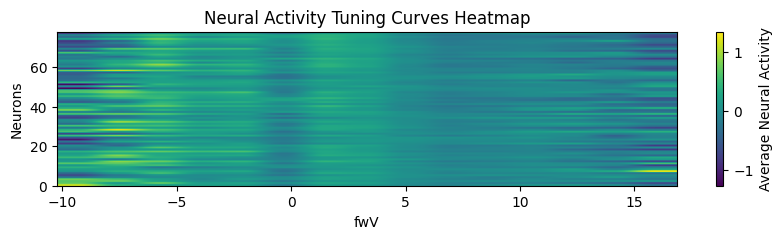

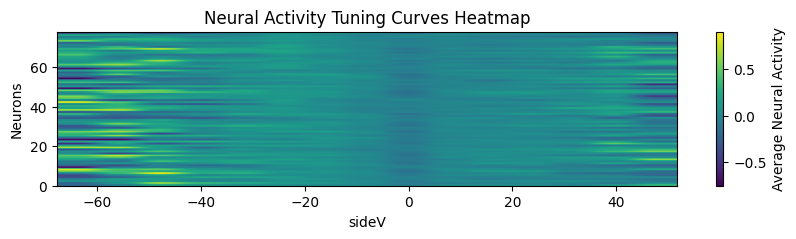

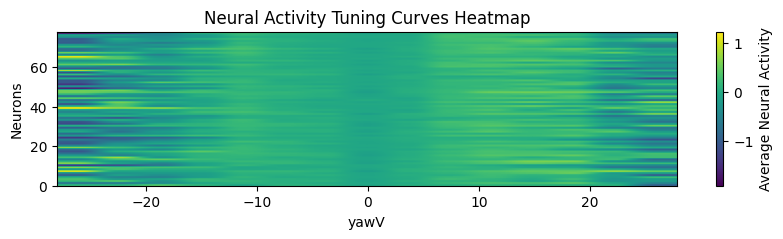

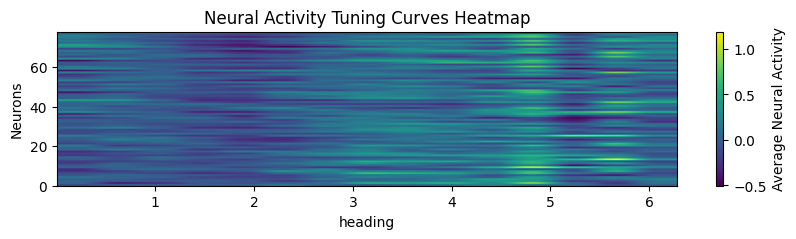

In [234]:
# Determine the number of rows and columns for the subplot grid
behavioral_variables = [behav_df.fwV, behav_df.sideV, behav_df.yawV, behav_df.heading]
filtered_behavior_variables = [filter_based_on_histogram(var, 0.5) for var in behavioral_variables]
neural_activity = sn_binx
num_bins = 15
neurons_to_plot = [0, 10, 20, 30, 40, 50]
num_behavioral_variables = len(filtered_behavior_variables)
for i, behavior_variable in enumerate(filtered_behavior_variables):
    tuning_curve_1d(behavior_variable, neural_activity,neurons_to_plot,num_bins)
# Loop through behavioral variables and plot
for i, behavior_variable in enumerate(filtered_behavior_variables):
    tuning_curve_pop(num_bins, behavior_variable, neural_activity)



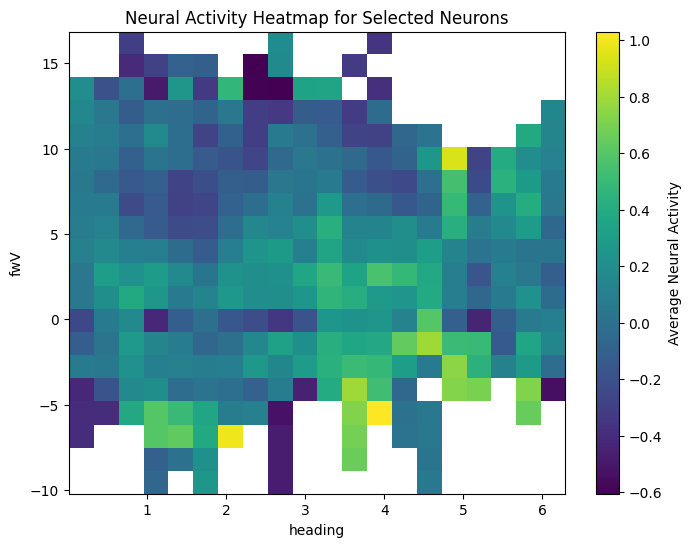

In [235]:
tuning_curve_2d(behav_df.fwV, behav_df.heading, neural_activity,random.sample(range(0, neural_activity.shape[0]), 70),20,20)